<a href="https://colab.research.google.com/github/Ankit7Das/Automatic-Detection-of-Schizophrenia-using-Spectrograms-from-EEG-Signals/blob/main/ankit_Sz_RepOD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install mne datasets transformers torch

from glob import glob
import mne
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from matplotlib.figure import Figure

import seaborn as sns
import math
import cv2
import pywt
from PIL import Image

import scipy.stats as stats
from scipy.fftpack import fft, ifft
from scipy import signal
from scipy.signal import butter, sosfilt, sosfreqz

from sklearn.model_selection import GroupKFold, LeaveOneGroupOut, KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.utils import shuffle
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score

import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Conv1D, BatchNormalization, LeakyReLU, ReLU, MaxPool2D, MaxPool1D, GlobalAveragePooling2D, Dense, Dropout, AveragePooling2D,\
Flatten, Input, concatenate, Activation
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.backend import clear_session
from tensorflow.keras.optimizers.legacy import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import Sequential

from librosa.feature import melspectrogram

np.random.seed(1)
plt.style.use('seaborn-poster')
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 35.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 49.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 86.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 68.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 119.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 35.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━

<ipython-input-1-26ff21af5cec>:44: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-poster')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
all_file_path=glob('drive/MyDrive/Ankit/Dataset/*.edf')
print(len(all_file_path))

28


In [ ]:
healthy_file_path=[i for i in all_file_path if 'h' in i.split("/")[-1]]
patient_file_path=[i for i in all_file_path if 's' in i.split("/")[-1]]
print(len(healthy_file_path),len(patient_file_path))

14 14


In [ ]:
# Baseline removal function

def calc_baseline(signal):
    """
    Calculate the baseline of signal.
    Args:
        signal (numpy 1d array): signal whose baseline should be calculated
    Returns:
        baseline (numpy 1d array with same size as signal): baseline of the signal
    """
    ssds = np.zeros((3))

    cur_lp = np.copy(signal)
    iterations = 0
    while True:
        # Decompose 1 level
        lp, hp = pywt.dwt(cur_lp, "db4")

        # Shift and calculate the energy of detail/high pass coefficient
        ssds = np.concatenate(([np.sum(hp ** 2)], ssds[:-1]))

        # Check if we are in the local minimum of energy function of high-pass signal
        if ssds[2] > ssds[1] and ssds[1] < ssds[0]:
            break

        cur_lp = lp[:]
        iterations += 1

    # Reconstruct the baseline from this level low pass signal up to the original length
    baseline = cur_lp[:]
    for _ in range(iterations):
        baseline = pywt.idwt(baseline, np.zeros((len(baseline))), "db4")

    return baseline[: len(signal)]

In [ ]:
# Data Loader

def load_data(path, len):
    data = mne.io.read_raw_edf(path, preload=True, verbose=False)
    data.set_eeg_reference(verbose=False)
    # data.filter(l_freq=1, h_freq=30, verbose=False)
    # epochs = mne.make_fixed_length_epochs(data, duration=10, overlap=0, verbose=False)
    arr = data.get_data()

    # print(arr.shape)

    # plt.plot(arr[0][0])
    # plt.show()

    # array = np.array([x - calc_baseline(x) for x in arr])

    # plt.plot(calc_baseline(arr[0][0]))
    # plt.show()

    # plt.plot(array[0][0])
    # plt.show()

    arr = np.array(arr[:,:len*2500])

    return np.array(arr)

res = load_data(healthy_file_path[0], 86)
res.shape

(19, 215000)

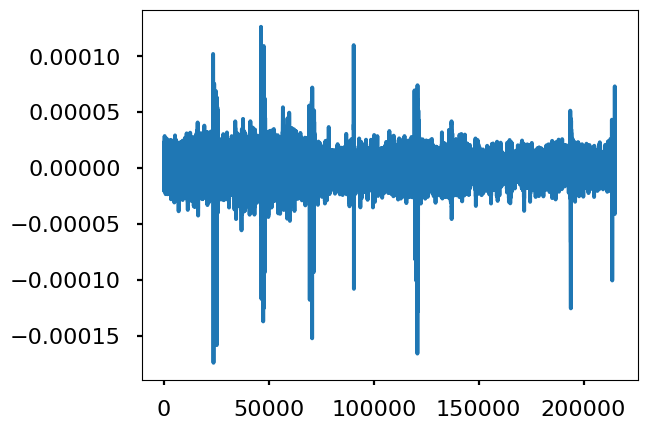

In [ ]:
fig = plt.figure()
fig.set_figheight(4.8)
fig.set_figwidth(6.4)
plt.plot(res[0])
plt.show()

In [ ]:
channels = ['Fp2', 'F8', 'T4', 'T6', 'O2', 'Fp1', 'F7', 'T3', 'T5', 'O1', 'F4', 'C4', 'P4', 'F3', 'C3', 'P3', 'Fz', 'Cz', 'Pz']

In [ ]:
%%capture
# Loading data

healthy = [load_data(x, 86) for x in healthy_file_path]
patient = [load_data(x, 74) for x in patient_file_path]

In [ ]:
from scipy.signal import resample

In [ ]:
def downsample(X):
    secs = len(X)//250 # Number of seconds in signal X
    samps = secs*128     # Number of samples to downsample
    Y = resample(X, samps)
    return Y

In [ ]:
healthy = [[downsample(y) for y in x] for x in healthy]
patient = [[downsample(y) for y in x] for x in patient]

In [ ]:
base_dir = 'drive/MyDrive/Ankit/Dataset/'

In [ ]:
import os
from tqdm import tqdm

normalfiles=os.listdir(base_dir + 'norm/')
r=0
with tqdm(total=len(normalfiles)) as pbar:
    for file in normalfiles:
        feats=[]
        filename=base_dir + "norm/"+file
        f = open(filename, 'r')     #opening file
        x = f.readline()
        sublist=[]
        i=0
        while x:
            if i<=7679:                     #getting features per channels
                sublist.append(float(x))
            else:
                i=0
                sublist=np.array(sublist)
                feats.append(sublist)
                sublist=[]
                sublist.append(float(x))
            i+=1
            x=f.readline()
        sublist=np.array(sublist)
        feats.append(sublist)
        feats=np.array(feats)
        healthy.append(feats)      #1,0 for nomal
        pbar.update(1)

healthy=np.array(healthy)
print(healthy.shape)

# with open('normal_features', 'wb') as fp:
#     pickle.dump(features, fp)

# with open('normal_labels', 'wb') as fp:
#     pickle.dump(labels, fp)



illfiles=os.listdir(base_dir + 'sch/')
r=0
with tqdm(total=len(illfiles)) as pbar:
    for file in illfiles:
        feats=[]
        filename=base_dir + "sch/"+file
        f = open(filename, 'r')     #opening file
        x = f.readline()
        sublist=[]
        i=0
        while x:
            if i<=7679:                     #getting features per channels
                sublist.append(float(x))
            else:
                i=0
                sublist=np.array(sublist)
                feats.append(sublist)
                sublist=[]
                sublist.append(float(x))
            i+=1
            x=f.readline()
        sublist=np.array(sublist)
        feats.append(sublist)
        feats=np.array(feats)
        patient.append(feats)    #1,0 for nomal
        pbar.update(1)

patient=np.array(patient)
print(patient.shape)

# with open('ill_features', 'wb') as fp:
#     pickle.dump(features, fp)

100%|██████████| 39/39 [00:29<00:00,  1.31it/s]
<ipython-input-28-b3ebf97651f2>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  healthy=np.array(healthy)


(53,)


100%|██████████| 45/45 [00:30<00:00,  1.48it/s]

(59,)



<ipython-input-28-b3ebf97651f2>:69: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  patient=np.array(patient)


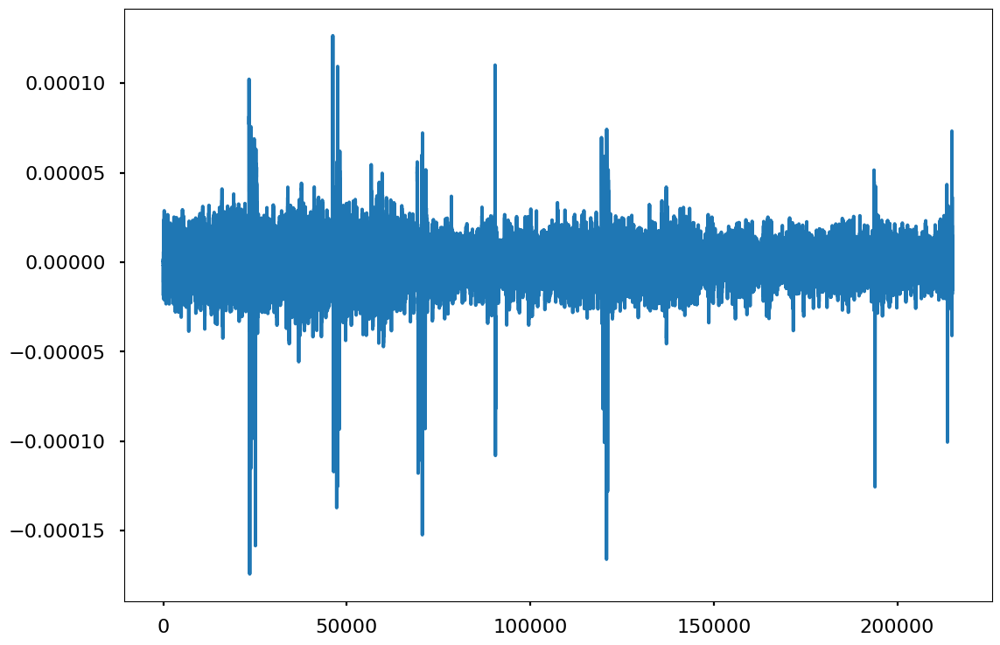

In [ ]:
plt.plot(healthy[0][0])
plt.show()

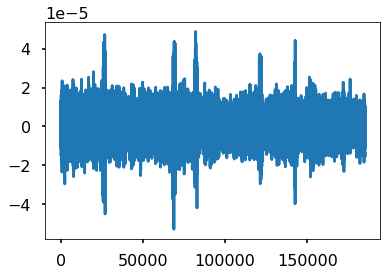

In [ ]:
plt.plot(patient[0][0])
plt.show()

In [ ]:
len(healthy[0])

19

In [ ]:
# Baseline Removal for each signal

bsr_healthy = [[y-calc_baseline(y) for y in x] for x in healthy]
bsr_patient = [[y-calc_baseline(y) for y in x] for x in patient]

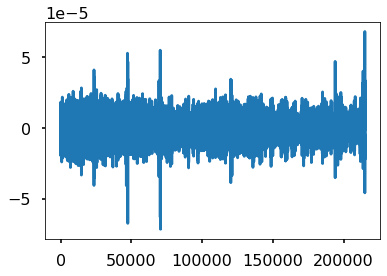

In [ ]:
plt.plot(bsr_healthy[0][0])
plt.show()

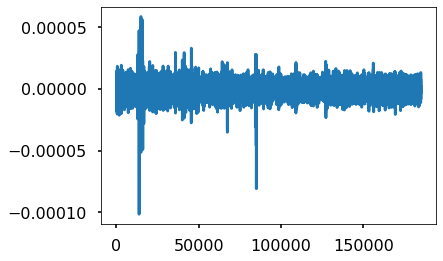

In [ ]:
plt.plot(bsr_patient[0][0])
plt.show()

In [ ]:
len(bsr_healthy), len(bsr_healthy[0]), len(bsr_healthy[0][0])

(53, 19, 110080)

In [ ]:
samp_freq = 128  # Sample frequency (Hz)
notch_freq = 50.0  # Frequency to be removed from signal (Hz)
quality_factor = 20.0  # Quality factor

# Design a notch filter using signal.iirnotch
b_notch, a_notch = signal.iirnotch(notch_freq, quality_factor, samp_freq)

In [ ]:
# Filtering each signal

notched_healthy = [[signal.filtfilt(b_notch, a_notch, y) for y in x] for x in bsr_healthy]
notched_patient = [[signal.filtfilt(b_notch, a_notch, y) for y in x] for x in bsr_patient]

In [ ]:
len(notched_healthy[0]), len(notched_healthy[0][0])

(19, 110080)

In [ ]:
# filter

lowcut = 4
highcut = 45
nyquistFreq = 64
order = 5

low  = lowcut / nyquistFreq
high = highcut / nyquistFreq

sos  = butter(order, [low, high], btype='bandpass', output='sos')

In [ ]:
w, h = sosfreqz(sos, worN=1500)

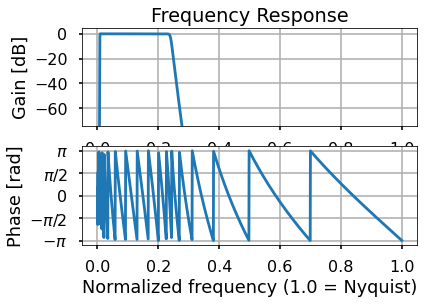

In [ ]:
plt.subplot(2, 1, 1)
db = 20*np.log10(np.maximum(np.abs(h), 1e-5))
plt.plot(w/np.pi, db)
plt.ylim(-75, 5)
plt.grid(True)
plt.yticks([0, -20, -40, -60])
plt.ylabel('Gain [dB]')
plt.title('Frequency Response')
plt.subplot(2, 1, 2)
plt.plot(w/np.pi, np.angle(h))
plt.grid(True)
plt.yticks([-np.pi, -0.5*np.pi, 0, 0.5*np.pi, np.pi],
           [r'$-\pi$', r'$-\pi/2$', '0', r'$\pi/2$', r'$\pi$'])
plt.ylabel('Phase [rad]')
plt.xlabel('Normalized frequency (1.0 = Nyquist)')
plt.show()

In [ ]:
# Filtering each signal

filtered_healthy = [[sosfilt(sos, y) for y in x] for x in notched_healthy]
filtered_patient = [[sosfilt(sos, y) for y in x] for x in notched_patient]

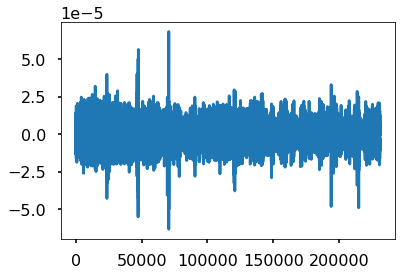

In [ ]:
plt.plot(filtered_healthy[0][0])
plt.show()

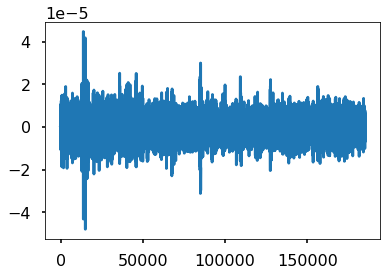

In [ ]:
plt.plot(filtered_patient[0][0])
plt.show()

In [ ]:
len(filtered_healthy[0]), len(filtered_healthy[0][0])

(19, 110080)

In [ ]:
!pip install pyedflib
import pyedflib
import os

In [ ]:
for i, x in enumerate(filtered_healthy):
    file_name = os.path.join('drive/MyDrive/Ankit/Dataset/Preprocessed', 'healthy'+str(i)+'.edf')
    f = pyedflib.EdfWriter(file_name, 19)
    channel_info = []
    data_list = []

    for j, ch in enumerate(channels):
        x[j]= x[j]*1000000
        l = np.min(x[j])
        h = np.max(x[j])
        ch_dict = {'label': ch, 'dimension': 'uV', 'sample_rate': 1250.0, 'sample_frequency': 1250.0, 'physical_max': h, 'physical_min': l, 'digital_max': 32767, 'digital_min': -32767}
        channel_info.append(ch_dict)
        data_list.append(x[j])

    f.setSignalHeaders(channel_info)
    f.writeSamples(data_list)
    f.close()
    del f

for i, x in enumerate(filtered_patient):
    file_name = os.path.join('drive/MyDrive/Ankit/Dataset/Preprocessed', 'patient'+str(i)+'.edf')
    f = pyedflib.EdfWriter(file_name, 19)
    channel_info = []
    data_list = []

    for j, ch in enumerate(channels):
        x[j]= x[j]*1000000
        l = np.min(x[j])
        h = np.max(x[j])
        ch_dict = {'label': ch, 'dimension': 'uV', 'sample_rate': 1250.0, 'sample_frequency': 1250.0, 'physical_max': h, 'physical_min': l, 'digital_max': 32767, 'digital_min': -32767}
        channel_info.append(ch_dict)
        data_list.append(x[j])

    f.setSignalHeaders(channel_info)
    f.writeSamples(data_list)
    f.close()
    del f

In [ ]:
# Splitting each signal

seg_healthy = [np.split(np.array(x), len(x[0])//2560, axis=1) for x in filtered_healthy]
seg_patient = [np.split(np.array(x), len(x[0])//2560, axis=1) for x in filtered_patient]

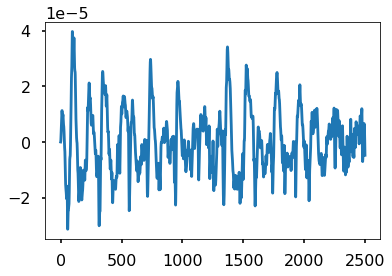

In [ ]:
plt.plot(seg_healthy[0][0][0])
plt.show()

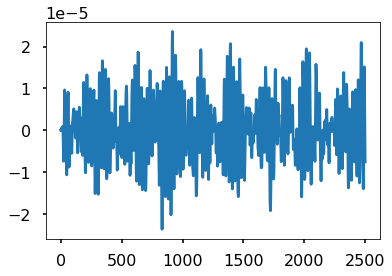

In [ ]:
plt.plot(seg_patient[0][0][0])
plt.show()

In [ ]:
len(seg_healthy), len(seg_healthy[0]), len(seg_healthy[0][0]), len(seg_healthy[0][0][0])

(53, 43, 19, 2560)

In [ ]:
# Converting data to np.array

seg_healthy = [np.array(x) for x in seg_healthy]
seg_patient = [np.array(x) for x in seg_patient]

In [ ]:
seg_healthy[0].shape

(43, 19, 2560)

In [ ]:
# Reshaping data

seg_healthy = [x.reshape(x.shape[0]*x.shape[1], x.shape[2]) for x in seg_healthy]
seg_patient = [x.reshape(x.shape[0]*x.shape[1], x.shape[2]) for x in seg_patient]

In [ ]:
seg_healthy[0].shape

(817, 2560)

In [ ]:
# L2 normalization
from scipy import stats

# norm_healthy = [np.array([(y-np.min(y))/(np.max(y)-np.min(y)) for y in x]) for x in seg_healthy]
# norm_patient = [np.array([(y-np.min(y))/(np.max(y)-np.min(y)) for y in x]) for x in seg_patient]

norm_healthy = [np.array([stats.zscore(y) for y in x]) for x in seg_healthy]
norm_patient = [np.array([stats.zscore(y) for y in x]) for x in seg_patient]

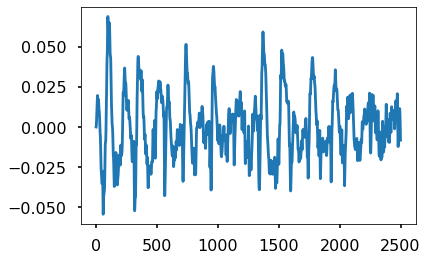

In [ ]:
plt.plot(norm_healthy[0][0])
plt.show()

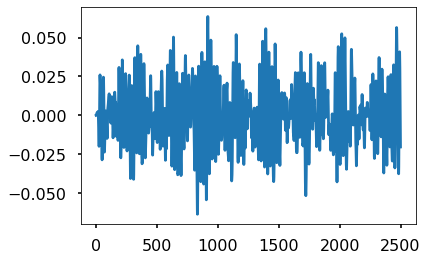

In [ ]:
plt.plot(norm_patient[0][0])
plt.show()

In [ ]:
norm_healthy[0].shape

(817, 2560)

In [ ]:
# Stacking healthy and patient data

healthy_data = np.vstack(norm_healthy)
patient_data = np.vstack(norm_patient)

In [ ]:
healthy_data.shape, patient_data.shape

((13310, 2560), (12002, 2560))

In [ ]:
# Producing Spectrogram and resizing

spec_data_healthy = []

i = 0
for data in healthy_data:
    fig = Figure()
    fig.set_figheight(1.12)
    fig.set_figwidth(1.12)
    canvas = FigureCanvas(fig)
    ax = fig.gca()
    ax.axis('off')
    ax.margins(0,0)
    _, _, _, _ = ax.specgram(data, Fs=250)
    fig.tight_layout()
    canvas.draw()
    width, height = fig.get_size_inches() * fig.get_dpi()
    image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8').reshape(int(height), int(width), 3)
    spec_data_healthy.append(image)
    i += 1

print(i)

i = 0
spec_data_patient = []
for data in patient_data:
    fig = Figure()
    fig.set_figheight(1.12)
    fig.set_figwidth(1.12)
    canvas = FigureCanvas(fig)
    ax = fig.gca()
    ax.axis('off')
    ax.margins(0,0)
    _, _, _, _ = ax.specgram(data, Fs=250)
    fig.tight_layout()
    canvas.draw()
    width, height = fig.get_size_inches() * fig.get_dpi()
    image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8').reshape(int(height), int(width), 3)
    spec_data_patient.append(image)
    i += 1

print(i)
spec_data_healthy[0].shape, spec_data_patient[0].shape

13310
12002


((112, 112, 3), (112, 112, 3))

In [ ]:
!pip install neurokit2
import neurokit2 as nk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 48.8 MB/s eta 0:00:00


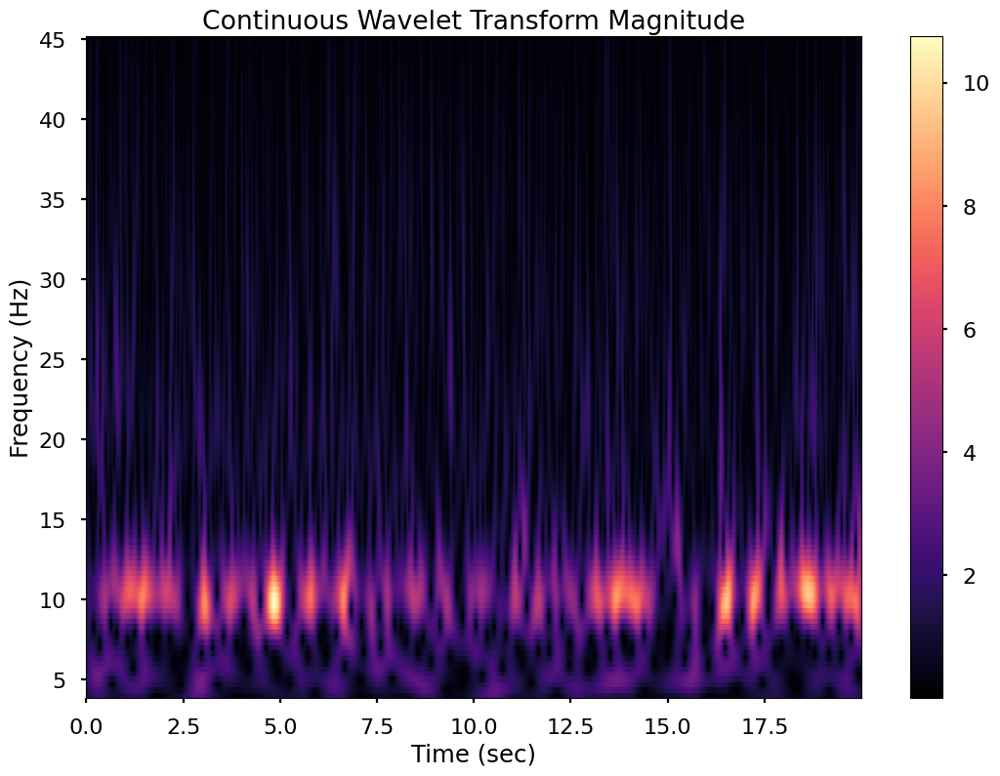

In [ ]:
f, t, cwtm = nk.signal_timefrequency(healthy_data[0],
                                     250,
                                     min_frequency=4,
                                     max_frequency=45,
                                     method="cwt",
                                     show=True)

In [ ]:
i = 50
fig = plt.figure()
fig.set_figheight(1.12)
fig.set_figwidth(1.12)
# canvas = FigureCanvas(fig)
ax = fig.add_subplot()
ax.axis('off')
ax.margins(0,0)
_, _, pwvd = nk.signal_timefrequency(healthy_data[0], 250, min_frequency=4, max_frequency=45, method="cwt", show=False)
plt.imshow(pwvd, aspect='auto')
fig.tight_layout()
txt = str(i)
plt.savefig('h'+txt.zfill(5)+'.jpeg')
# canvas.draw()
# width, height = fig.get_size_inches() * fig.get_dpi()
# image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8').reshape(int(height), int(width), 3)
plt.close(fig)

In [ ]:
img = Image.open('h'+txt.zfill(5)+'.jpeg')
width, height = img.size
im = np.array(img)
im.shape

(112, 112, 3)

In [ ]:
!pip install cvlib
import cvlib
import cv2
import librosa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 63.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for cvlib: filename=cvlib-0.2.7-py3-none-any.whl size=10046368 sha256=256da341348b9c57801e50806089aeb890c43e7af2abd64d728aad2f5f9fa476
  Stored in directory: /root/.cache/pip/wheels/9e/a5/d4/fe37b48fe4f4b621ba5e574a991230070f3cc4f02322a01489
  Created wheel for progressbar: filename=progressbar-2.5-py3-none-any.whl size=12067 sha256=050c64e3a801d948e979b0fcd7c8a8b8b0e6e9f88b58bf11dafed456d21e166d
  Stored in directory: /root/.cache/pip/wheels/cd/17/e5/765d1a3112ff3978f70223502f6047e06c43a24d7c5f8ff95b
Successfully built cvlib progressbar


In [ ]:
_, _, pwvd = nk.signal_timefrequency(healthy_data[0], 250, min_frequency=4, max_frequency=45, method="cwt", show=False)
mel_spec=librosa.feature.melspectrogram( y=healthy_data[0], sr=250, window='hann')
log_spectrogram = librosa.amplitude_to_db(pwvd)
norm=(log_spectrogram-np.min(log_spectrogram))/(np.max(log_spectrogram)-np.min(log_spectrogram))
img = pwvd
img=cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
cmap = plt.get_cmap('jet')
rgba_img = cmap(img)
rgb_img = np.delete(rgba_img, 3, 2)
clip_rgb=np.flip(rgb_img, 0)
# audio_rgb_list.append(clip_rgb)
clip_rgb.shape

(112, 112, 3)

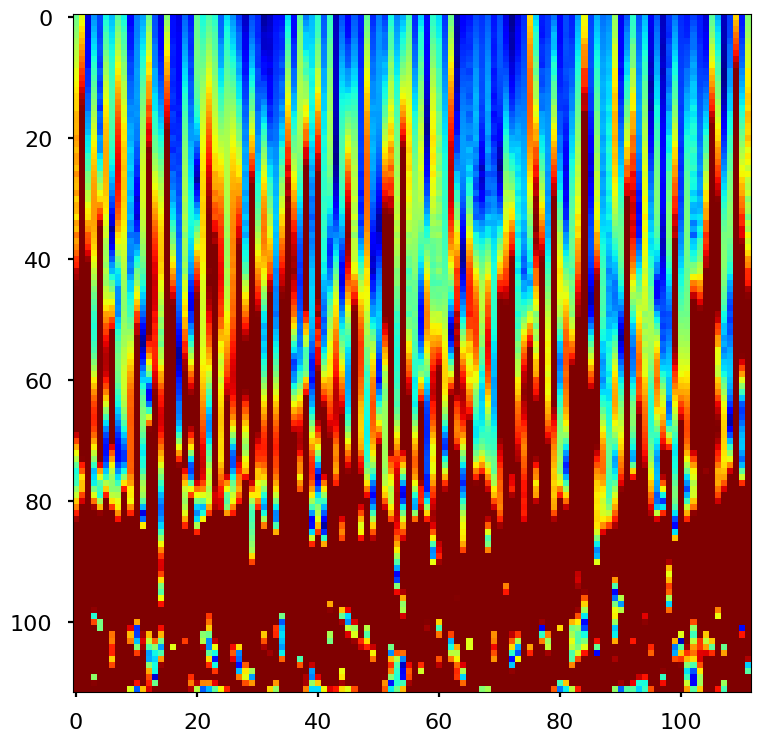

In [ ]:
from google.colab.patches import cv2_imshow

plt.imshow(clip_rgb)

In [ ]:
# Producing Scalogram and resizing

# spec_data = []
spec_data_healthy = []
# base_dir = "drive/MyDrive/Ankit/scalogram/"

i = 0
for data in healthy_data:
    _, _, cwt = nk.signal_timefrequency(data, 128, min_frequency=4, max_frequency=45, method="cwt", show=False)
    log_cwt = librosa.amplitude_to_db(cwt)
    norm = (log_cwt-np.min(log_cwt))/(np.max(log_cwt)-np.min(log_cwt))
    img = norm
    img = cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
    cmap = plt.get_cmap('jet')
    rgba_img = cmap(img)
    rgb_img = np.delete(rgba_img, 3, 2)
    clip_rgb = np.flip(rgb_img, 0)
    spec_data_healthy.append(clip_rgb)
    i += 1

print(i)

i = 0
spec_data_patient = []
for data in patient_data:
    _, _, cwt = nk.signal_timefrequency(data, 128, min_frequency=4, max_frequency=45, method="cwt", show=False)
    log_cwt = librosa.amplitude_to_db(cwt)
    norm = (log_cwt-np.min(log_cwt))/(np.max(log_cwt)-np.min(log_cwt))
    img = norm
    img = cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
    cmap = plt.get_cmap('jet')
    rgba_img = cmap(img)
    rgb_img = np.delete(rgba_img, 3, 2)
    clip_rgb = np.flip(rgb_img, 0)
    spec_data_patient.append(clip_rgb)
    i += 1

print(i)
# spec_data[0].shape
spec_data_healthy[0].shape, spec_data_patient[0].shape

13310
12002


((112, 112, 3), (112, 112, 3))

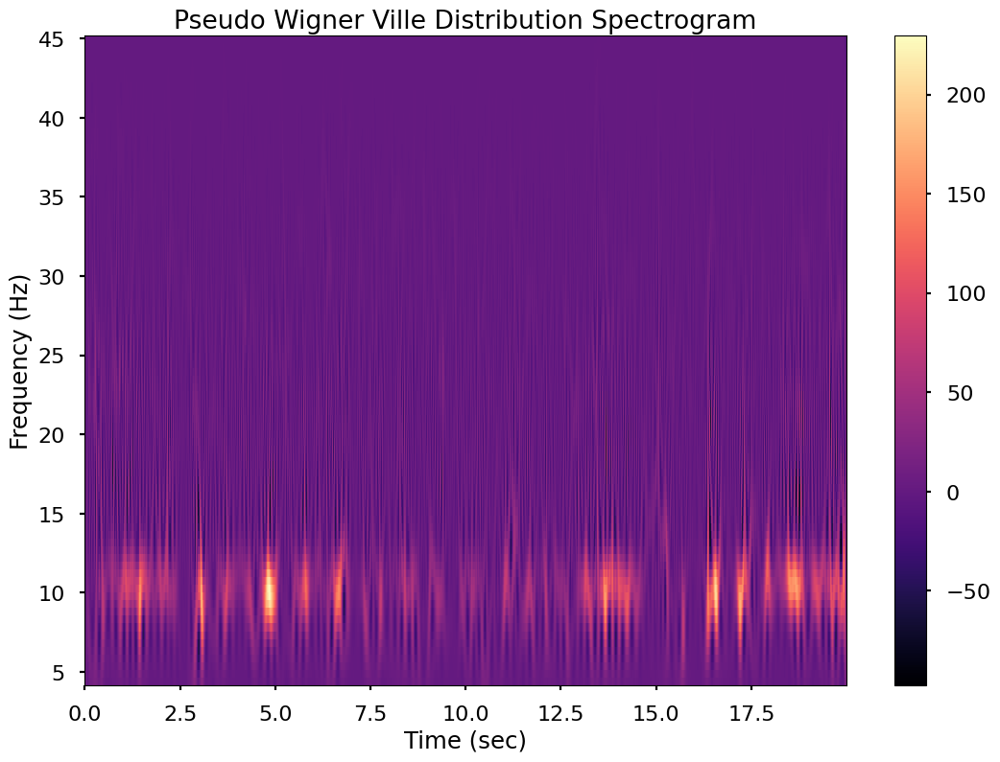

In [ ]:
f, t, pwvd = nk.signal_timefrequency(healthy_data[0],
                                     250,
                                     min_frequency=4,
                                     max_frequency=45,
                                     method="pwvd",
                                     show=True)

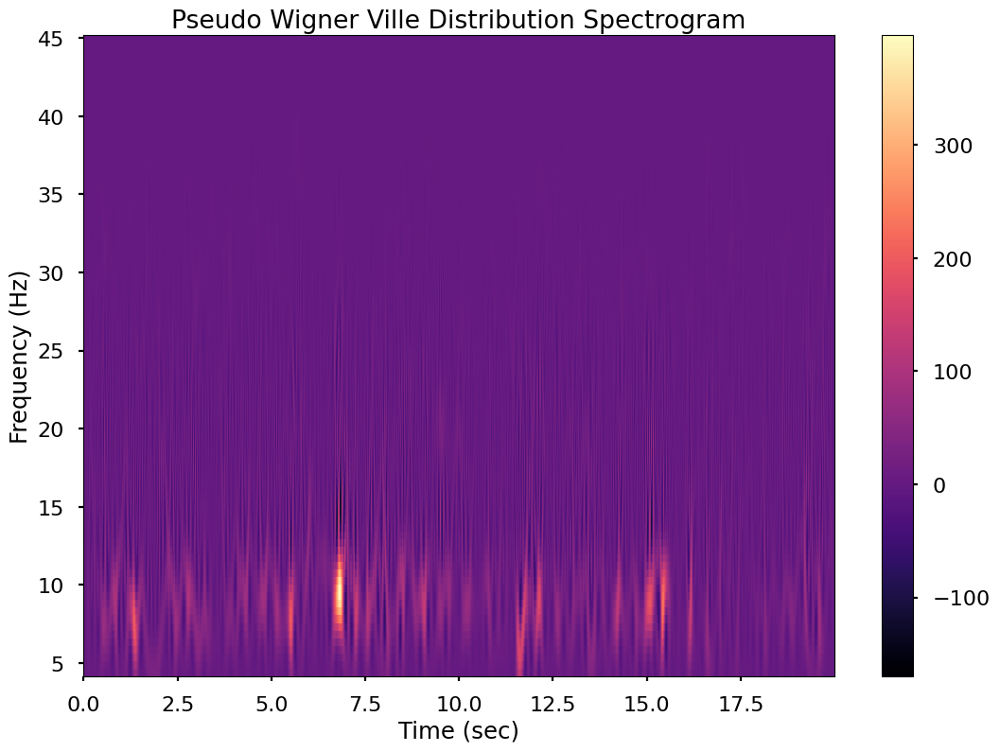

In [ ]:
f, t, pwvd = nk.signal_timefrequency(patient_data[0],
                                     250,
                                     min_frequency=4,
                                     max_frequency=45,
                                     method="pwvd",
                                     show=True)

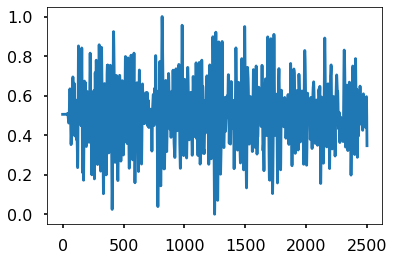

In [ ]:
plt.plot(healthy_data[0])
plt.show()

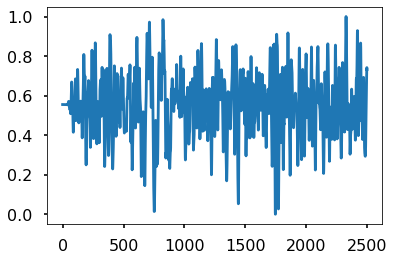

In [ ]:
plt.plot(patient_data[0])
plt.show()

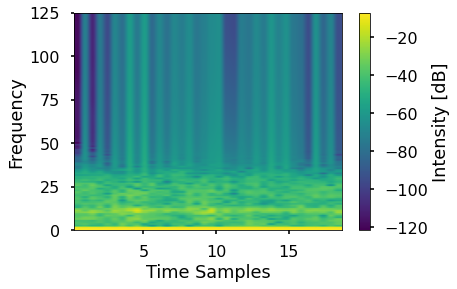

In [ ]:
Pxx, f, t, im = plt.specgram(healthy_data[0], Fs=250)
plt.colorbar(im).set_label('Intensity [dB]')
plt.xlabel("Time Samples")
plt.ylabel("Frequency")
plt.show()

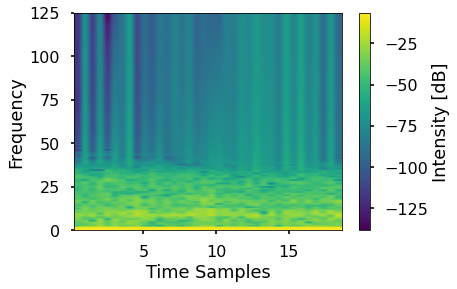

In [ ]:
Pxx, f, t, im = plt.specgram(patient_data[0], Fs=250)
plt.colorbar(im).set_label('Intensity [dB]')
plt.xlabel("Time Samples")
plt.ylabel("Frequency")
plt.show()

In [ ]:
for i in range(10):
    plt.imshow(spec_data_healthy[i])
    plt.show()

In [ ]:
for i in range(10):
    plt.imshow(spec_data_patient[i])
    plt.show()

In [ ]:
nspec_data_healthy_array = np.array(spec_data_healthy)
nspec_data_patient_array = np.array(spec_data_patient)
nspec_data_healthy_array.shape, nspec_data_patient_array.shape

((13310, 112, 112, 3), (12002, 112, 112, 3))

In [ ]:
nsize = (112, 112)
nspec_data_healthy = []

for data in spec_data_healthy:
    S_im = Image.fromarray(data)
    S_res = S_im.resize(nsize)
    S_np = np.array(S_res)
    nspec_data_healthy.append(S_np)

nspec_data_patient = []

for data in spec_data_patient:
    S_im = Image.fromarray(data)
    S_res = S_im.resize(nsize)
    S_np = np.array(S_res)
    nspec_data_patient.append(S_np)

In [ ]:
nspec_data_healthy_array = np.array(nspec_data_healthy)
nspec_data_patient_array = np.array(nspec_data_patient)
nspec_data_healthy_array.shape, nspec_data_patient_array.shape

((11438, 112, 112, 3), (9842, 112, 112, 3))

In [ ]:
nspec_data_array = np.concatenate((nspec_data_healthy_array, nspec_data_patient_array))
nspec_data_array.shape

(25312, 112, 112, 3)

In [ ]:
# TSNE

y = np.concatenate((labels_healthy_array, labels_patient_array))

tsne = TSNE(n_components=2, verbose=1, random_state=123)
z = tsne.fit_transform(spec_data_array.reshape(spec_data_array.shape[0], spec_data_array.shape[1]*spec_data_array.shape[2]*spec_data_array.shape[3]))
df = pd.DataFrame()
df["y"] = y
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 2),
                data=df).set(title="Sz data T-SNE projection")

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [ ]:
# labels

labels_healthy_array = np.array(int(nspec_data_healthy_array.shape[0])*[0])
labels_patient_array = np.array(int(nspec_data_patient_array.shape[0])*[1])

labels_array = np.concatenate((labels_healthy_array, labels_patient_array))

labels_healthy_array.shape, labels_patient_array.shape

((13310,), (12002,))

In [ ]:
# Train, Validation, Test split (60, 20, 20)

X_healthy_train, X_healthy_test, y_healthy_train, y_healthy_test = train_test_split(nspec_data_healthy_array, labels_healthy_array, test_size=0.2, random_state=1)
X_healthy_train, X_healthy_val, y_healthy_train, y_healthy_val = train_test_split(X_healthy_train, y_healthy_train, test_size=0.25, random_state=1)

X_patient_train, X_patient_test, y_patient_train, y_patient_test = train_test_split(nspec_data_patient_array, labels_patient_array, test_size=0.2, random_state=1)
X_patient_train, X_patient_val, y_patient_train, y_patient_val = train_test_split(X_patient_train, y_patient_train, test_size=0.25, random_state=1)

In [ ]:
X_healthy_train.shape, X_healthy_val.shape, X_healthy_test.shape

((7986, 112, 112, 3), (2662, 112, 112, 3), (2662, 112, 112, 3))

In [ ]:
X_patient_train.shape, X_patient_val.shape, X_patient_test.shape

((7200, 112, 112, 3), (2401, 112, 112, 3), (2401, 112, 112, 3))

In [ ]:
# Concatenate healthy and patient data

X_train = np.concatenate((X_healthy_train, X_patient_train))
X_val = np.concatenate((X_healthy_val, X_patient_val))
X_test = np.concatenate((X_healthy_test, X_patient_test))

y_train = np.concatenate((y_healthy_train, y_patient_train))
y_val = np.concatenate((y_healthy_val, y_patient_val))
y_test = np.concatenate((y_healthy_test, y_patient_test))

X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((15186, 112, 112, 3),
 (5063, 112, 112, 3),
 (5063, 112, 112, 3),
 (15186,),
 (5063,),
 (5063,))

In [ ]:
# Shuffle

X_train_shuffled, y_train_shuffled = shuffle(X_train, y_train)
X_val_shuffled, y_val_shuffled = shuffle(X_val, y_val)
X_test_shuffled, y_test_shuffled = shuffle(X_test, y_test)

# Convolutional Neural Networks

In [ ]:
# VGG16

def Vgg16_model(input_shape):
    # model = Sequential()
    # # model.add(MobileNetV3Small(include_top=False,
    # #                     pooling='max',
    # #                     input_shape=input_shape))
    # model.add(TimeDistributed(Conv2D(8, kernel_size=(3, 3), activation='relu', padding="same", input_shape=input_shape)))
    # model.add(TimeDistributed(MaxPool2D(pool_size=(2, 2))))
    # model.add(TimeDistributed(Conv2D(8, kernel_size=(3, 3), activation='relu', padding="same")))
    # model.add(TimeDistributed(MaxPool2D(pool_size=(2, 2))))
    # model.add(TimeDistributed(Conv2D(8, kernel_size=(3, 3), activation='relu', padding="same")))
    # model.add(TimeDistributed(Flatten()))
    # model.add(LSTM(8, activation='relu'))
    # model.add(Dense(128, activation='relu'))
    # model.add(Dense(32, activation='relu'))
    # model.add(Dense(1, activation='sigmoid'))

    model = Sequential()
    model.add(Conv2D(input_shape=input_shape,filters=64,kernel_size=(3,3),padding="same", activation="relu"))
    model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    model.add(Flatten())
    model.add(Dense(units=1024,activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(units=256,activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(units=1, activation="sigmoid"))

    return model

model = Vgg16_model((112, 112, 3))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 112, 112, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 56, 56, 64)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 56, 56, 128)       147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 28, 28, 128)      0         
 2D)                                                    

In [ ]:
# CNN2D

def CNN2D(input_shape):
    # parameters:
    # input_shape - input shape for CNN model
    model = Sequential()
    model.add(Conv2D(64, (3,3), input_shape=input_shape, activation='relu', strides=1))
    # model.add(MaxPool2D((3,3), padding='same', strides=1))
    model.add(Conv2D(96, (3,3), activation='relu', strides=1))
    model.add(MaxPool2D((3,3), padding='same', strides=1))
    model.add(Conv2D(32, (3,3), activation='relu', strides=2))
    model.add(Dropout(0.5))
    model.add(Conv2D(16, (3,3), activation='relu', strides=2))
    model.add(MaxPool2D((3,3), padding='same', strides=1))
    model.add(Conv2D(8, (3,3), activation='relu'))
    model.add(Flatten())
    model.add(Dense(500, activation='relu'))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    return model

In [ ]:
model = CNN2D((112, 112, 3))
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_35 (Conv2D)          (None, 110, 110, 64)      1792      
                                                                 
 conv2d_36 (Conv2D)          (None, 108, 108, 96)      55392     
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 108, 108, 96)     0         
 g2D)                                                            
                                                                 
 conv2d_37 (Conv2D)          (None, 53, 53, 32)        27680     
                                                                 
 dropout_2 (Dropout)         (None, 53, 53, 32)        0         
                                                                 
 conv2d_38 (Conv2D)          (None, 26, 26, 16)        4624      
                                                      

In [ ]:
import itertools
from sklearn.metrics import confusion_matrix

In [ ]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def specificity(y_true, y_pred):
    neg_y_true = 1 - y_true
    neg_y_pred = 1 - y_pred
    fp = K.sum(neg_y_true * y_pred)
    tn = K.sum(neg_y_true * neg_y_pred)
    specificity = tn / (tn + fp + K.epsilon())
    return specificity

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

Epoch 1/50
119/119 [==============================] - 76s 440ms/step - loss: 0.7476 - binary_accuracy: 0.5155 - val_loss: 0.6895 - val_binary_accuracy: 0.5258
Epoch 2/50
119/119 [==============================] - 43s 359ms/step - loss: 0.6878 - binary_accuracy: 0.5358 - val_loss: 0.6640 - val_binary_accuracy: 0.5765
Epoch 3/50
119/119 [==============================] - 42s 356ms/step - loss: 0.6713 - binary_accuracy: 0.5600 - val_loss: 0.6645 - val_binary_accuracy: 0.5917
Epoch 4/50
119/119 [==============================] - 42s 356ms/step - loss: 0.6086 - binary_accuracy: 0.6604 - val_loss: 0.5007 - val_binary_accuracy: 0.7527
Epoch 5/50
119/119 [==============================] - 42s 356ms/step - loss: 0.4365 - binary_accuracy: 0.7964 - val_loss: 0.3543 - val_binary_accuracy: 0.8434
Epoch 6/50
119/119 [==============================] - 42s 356ms/step - loss: 0.3266 - binary_accuracy: 0.8590 - val_loss: 0.2671 - val_binary_accuracy: 0.8849
Epoch 7/50
119/119 [==========================

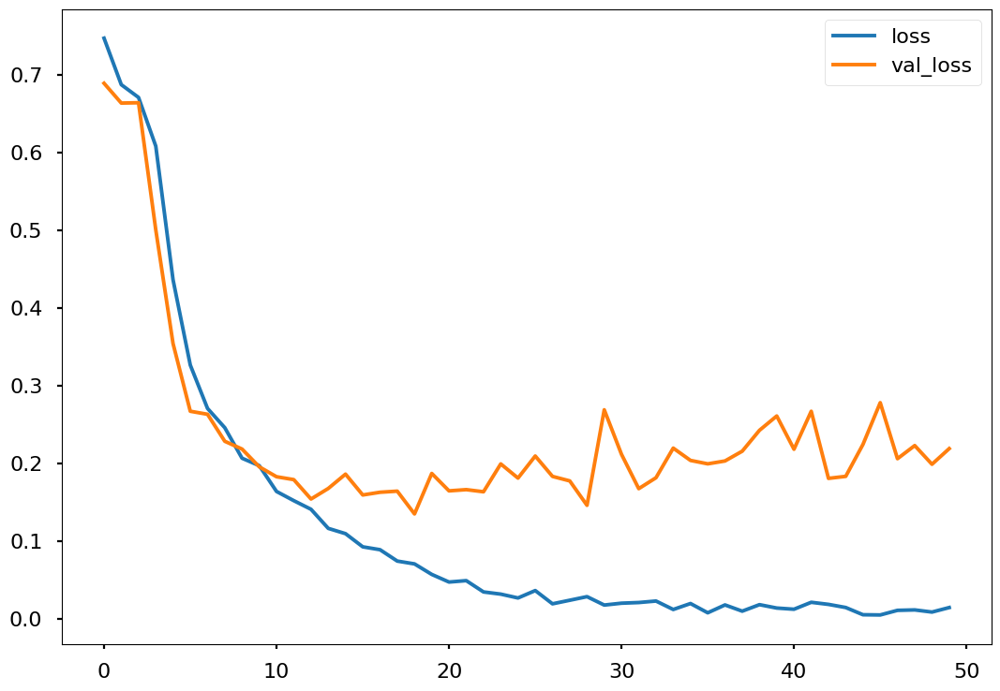

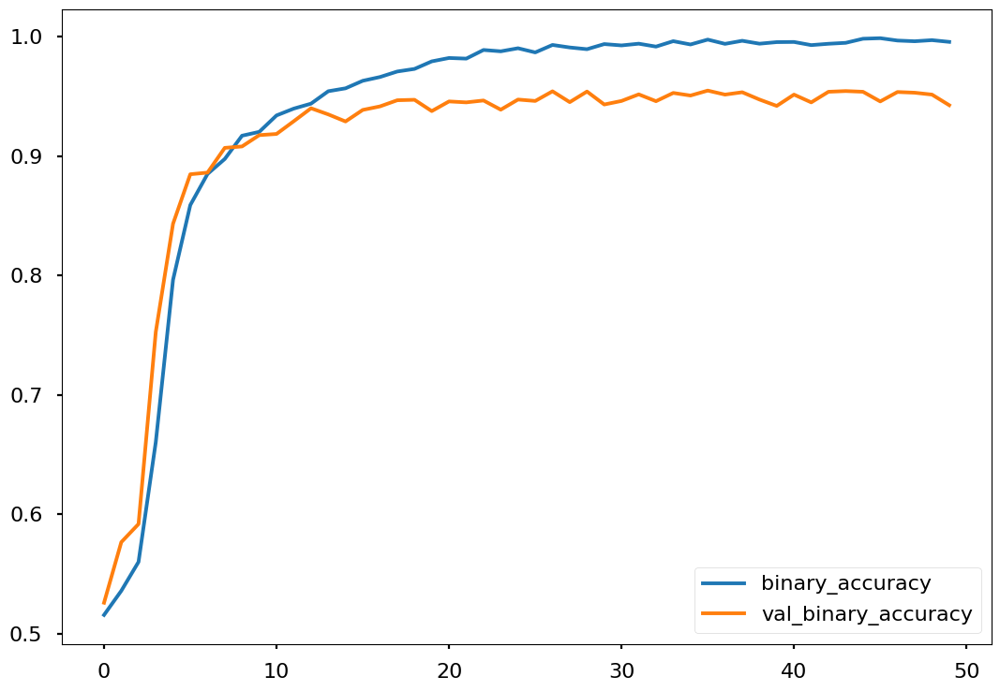

159/159 [==============================] - 4s 25ms/step


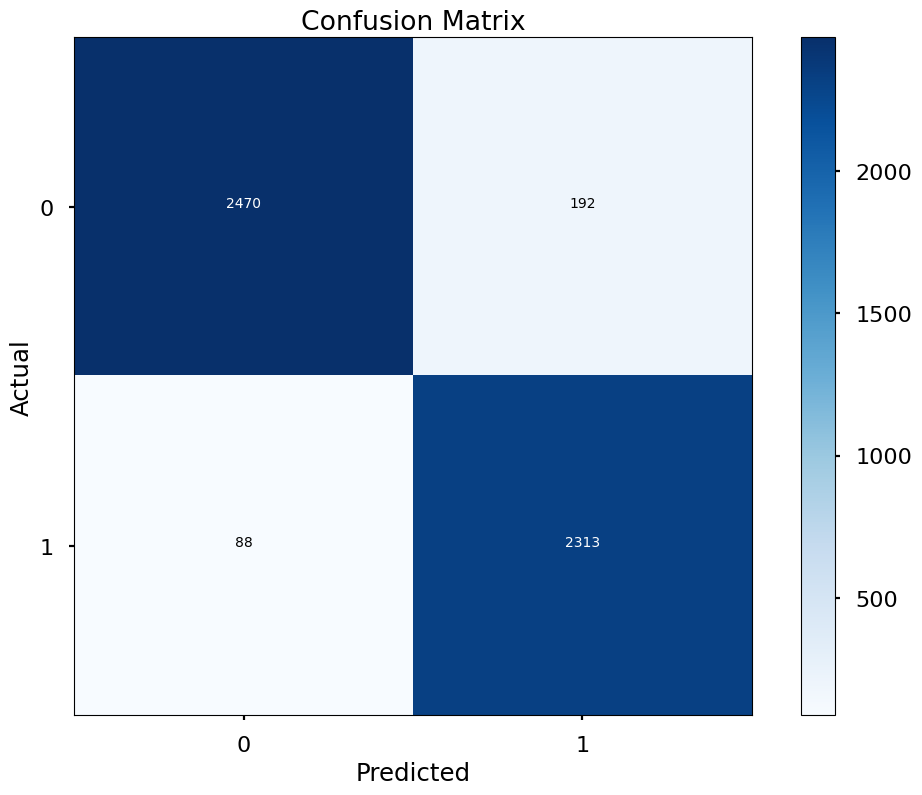

In [ ]:
# Spectrogram 2 dataset

optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.00001)
optimizer3 = SGD(learning_rate=0.0001)
optimizer4 = Adafactor(learning_rate=0.0001)
optimizer5 = AdamW(learning_rate=0.0001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy'])

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    #callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

y_pred = model.predict(X_test_shuffled)
y_test = y_test_shuffled.astype(int).tolist()
y_pred = np.round(y_pred).tolist()

cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_test))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
plt.show();

Epoch 1/50
100/100 [==============================] - 70s 447ms/step - loss: 0.7400 - binary_accuracy: 0.5269 - precision: 0.4787 - recall: 0.2586 - specificity: 0.5379 - f1_m: 0.3134 - val_loss: 0.6830 - val_binary_accuracy: 0.5375 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity: 0.5666 - val_f1_m: 0.0000e+00
Epoch 2/50
100/100 [==============================] - 36s 356ms/step - loss: 0.6659 - binary_accuracy: 0.5878 - precision: 0.5946 - recall: 0.3416 - specificity: 0.5603 - f1_m: 0.4214 - val_loss: 0.6469 - val_binary_accuracy: 0.6054 - val_precision: 0.6586 - val_recall: 0.3047 - val_specificity: 0.6610 - val_f1_m: 0.4196
Epoch 3/50
100/100 [==============================] - 35s 355ms/step - loss: 0.6031 - binary_accuracy: 0.6603 - precision: 0.6408 - recall: 0.6040 - specificity: 0.6055 - f1_m: 0.6099 - val_loss: 0.4606 - val_binary_accuracy: 0.7895 - val_precision: 0.9760 - val_recall: 0.5587 - val_specificity: 0.8425 - val_f1_m: 0.7079
Epoch 4/50
100/100 

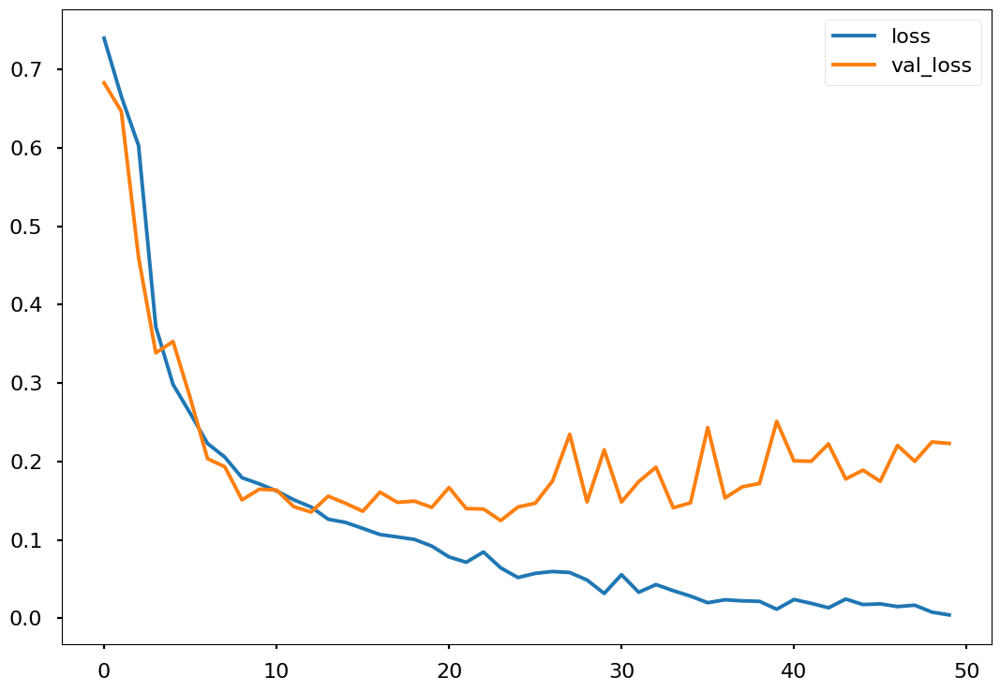

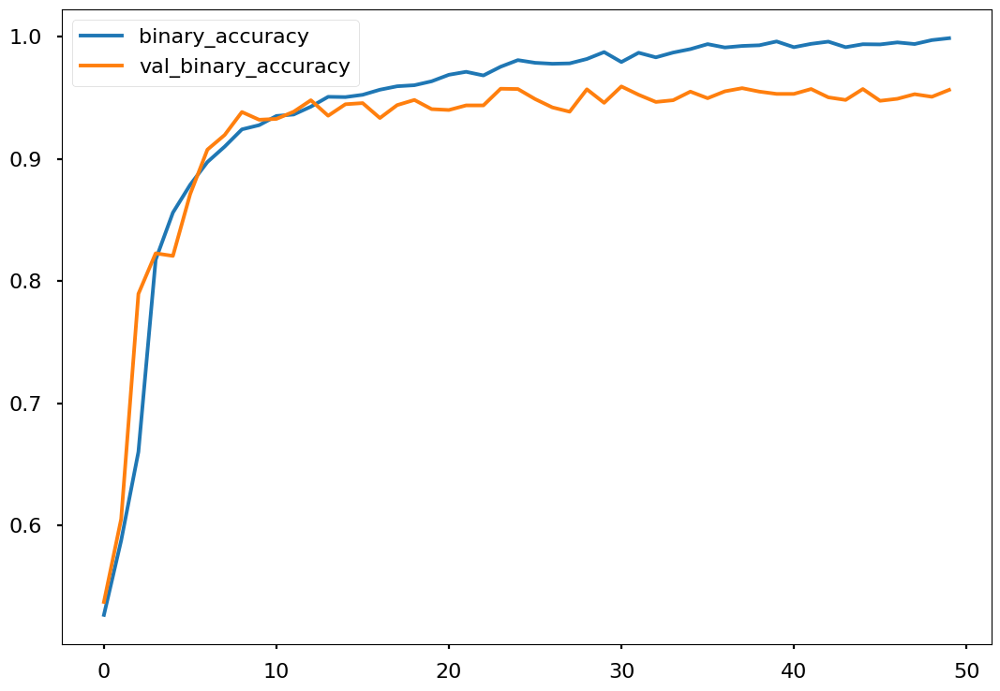

134/134 [==============================] - 3s 25ms/step


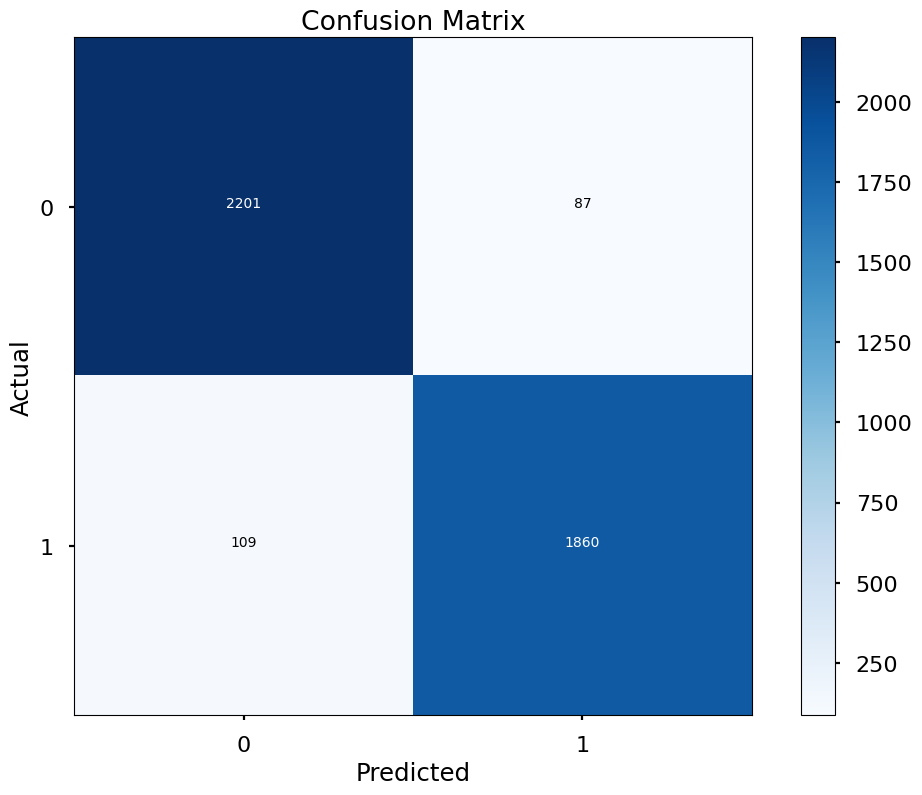

In [ ]:
# Spectrogram

optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.0001)
optimizer3 = SGD(learning_rate=0.0001)
optimizer4 = Adafactor(learning_rate=0.0001)
optimizer5 = AdamW(learning_rate=0.0001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

early_stopping = EarlyStopping(
    monitor='val_binary_accuracy',
    min_delta = 0.001, # minimium amount of change to count as an improvement
    patience = 30, # how many epochs to wait before stopping
    restore_best_weights = True,
)

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

y_pred = model.predict(X_test_shuffled)
y_test = y_test_shuffled.astype(int).tolist()
y_pred = np.round(y_pred).tolist()

cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_test))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
plt.show();

In [ ]:
# Scalogram

optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.0001)
optimizer3 = SGD(learning_rate=0.0001)
optimizer4 = Adafactor(learning_rate=0.0001)
optimizer5 = AdamW(learning_rate=0.0001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

early_stopping = EarlyStopping(
    monitor='val_binary_accuracy',
    min_delta = 0.001, # minimium amount of change to count as an improvement
    patience = 30, # how many epochs to wait before stopping
    restore_best_weights = True,
)

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 35,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

y_pred = model.predict(X_test_shuffled)
y_test = y_test_shuffled.astype(int).tolist()
y_pred = np.round(y_pred).tolist()

cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_test))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
plt.show();

NameError: ignored

Epoch 1/50
381/381 [==============================] - 20s 22ms/step - loss: 0.7489 - binary_accuracy: 0.7018 - val_loss: 0.3377 - val_binary_accuracy: 0.8412
Epoch 2/50
381/381 [==============================] - 7s 19ms/step - loss: 0.2854 - binary_accuracy: 0.8776 - val_loss: 0.1971 - val_binary_accuracy: 0.9256
Epoch 3/50
381/381 [==============================] - 7s 19ms/step - loss: 0.1921 - binary_accuracy: 0.9217 - val_loss: 0.2628 - val_binary_accuracy: 0.8924
Epoch 4/50
381/381 [==============================] - 7s 19ms/step - loss: 0.1780 - binary_accuracy: 0.9302 - val_loss: 0.1886 - val_binary_accuracy: 0.9163
Epoch 5/50
381/381 [==============================] - 7s 19ms/step - loss: 0.1643 - binary_accuracy: 0.9326 - val_loss: 0.1661 - val_binary_accuracy: 0.9302
Epoch 6/50
381/381 [==============================] - 7s 19ms/step - loss: 0.1368 - binary_accuracy: 0.9448 - val_loss: 0.1220 - val_binary_accuracy: 0.9475
Epoch 7/50
381/381 [==============================] - 7s 

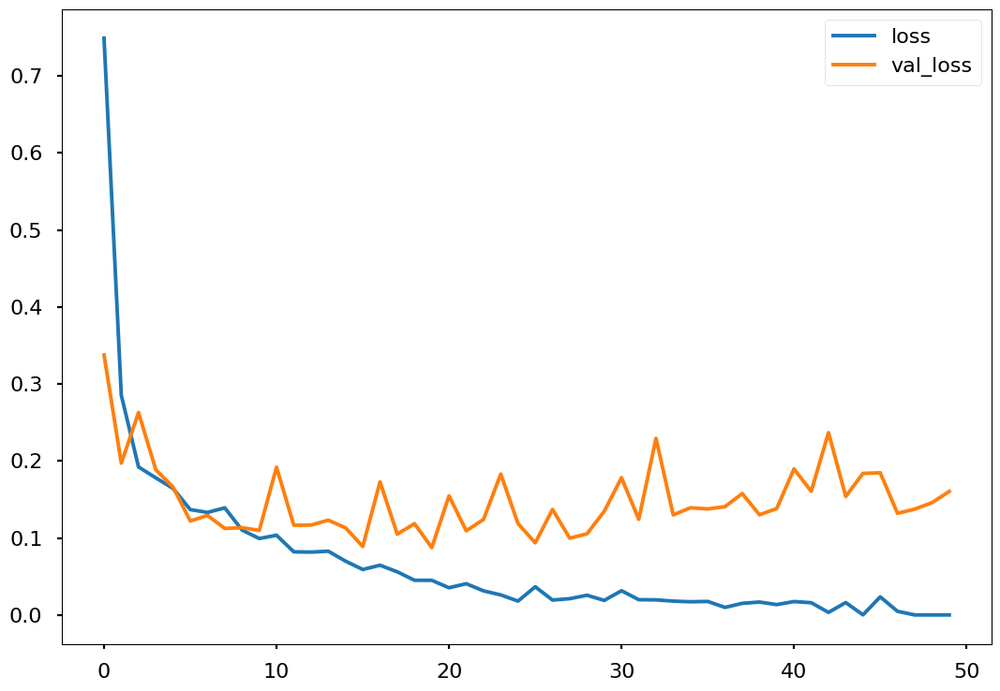

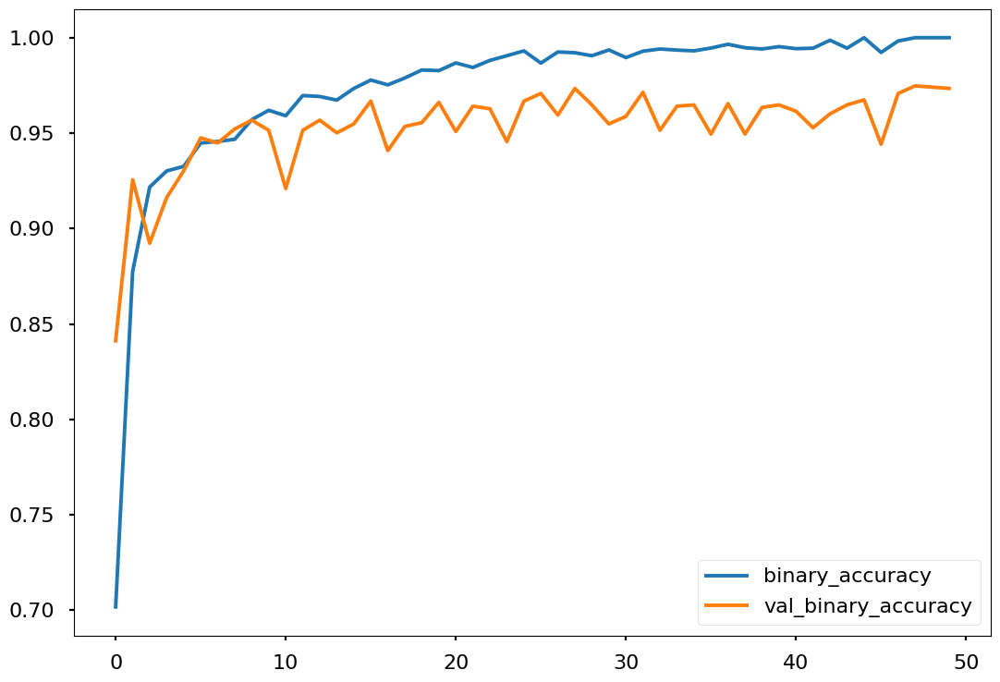

In [ ]:
# VGG16 for (112, 112, 3) 5 each dataset

optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.00001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer1, loss='binary_crossentropy', metrics=['binary_accuracy'])

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 32,
    validation_data = (X_val_shuffled, y_val_shuffled),
    #callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

In [ ]:
# VGG16 for (112, 112, 3) full dataset unfiltered no baseline correction

optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.00001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer1, loss='binary_crossentropy', metrics=['binary_accuracy'])

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    #callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

Epoch 1/50
267/267 [==============================] - 132s 463ms/step - loss: 0.6458 - binary_accuracy: 0.7852 - val_loss: 0.3949 - val_binary_accuracy: 0.8075
Epoch 2/50
267/267 [==============================] - 118s 441ms/step - loss: 0.3683 - binary_accuracy: 0.8310 - val_loss: 0.3244 - val_binary_accuracy: 0.8571
Epoch 3/50
267/267 [==============================] - 118s 440ms/step - loss: 0.3326 - binary_accuracy: 0.8478 - val_loss: 0.2768 - val_binary_accuracy: 0.8771
Epoch 4/50
267/267 [==============================] - 118s 440ms/step - loss: 0.2841 - binary_accuracy: 0.8714 - val_loss: 0.3498 - val_binary_accuracy: 0.8673
Epoch 5/50
267/267 [==============================] - 118s 441ms/step - loss: 0.2561 - binary_accuracy: 0.8869 - val_loss: 0.2265 - val_binary_accuracy: 0.9027
Epoch 6/50
267/267 [==============================] - 117s 439ms/step - loss: 0.2362 - binary_accuracy: 0.8973 - val_loss: 0.2091 - val_binary_accuracy: 0.9108
Epoch 7/50
  2/267 [....................

In [ ]:
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Adafactor, AdamW

In [ ]:
Skf = StratifiedKFold(random_state=1, shuffle=True)

Epoch 1/50
100/100 [==============================] - 49s 450ms/step - loss: 0.7257 - binary_accuracy: 0.5425 - precision_1: 0.5095 - recall_1: 0.2965 - specificity: 0.5428 - f1_m: 0.3536 - val_loss: 0.6618 - val_binary_accuracy: 0.6013 - val_precision_1: 0.5893 - val_recall_1: 0.4543 - val_specificity: 0.5227 - val_f1_m: 0.5117
Epoch 2/50
100/100 [==============================] - 35s 355ms/step - loss: 0.6498 - binary_accuracy: 0.6105 - precision_1: 0.6066 - recall_1: 0.4494 - specificity: 0.5694 - f1_m: 0.5000 - val_loss: 0.6421 - val_binary_accuracy: 0.6198 - val_precision_1: 0.7054 - val_recall_1: 0.3054 - val_specificity: 0.5422 - val_f1_m: 0.4230
Epoch 3/50
100/100 [==============================] - 36s 355ms/step - loss: 0.4617 - binary_accuracy: 0.7703 - precision_1: 0.8066 - recall_1: 0.6622 - specificity: 0.7087 - f1_m: 0.7188 - val_loss: 0.3503 - val_binary_accuracy: 0.8374 - val_precision_1: 0.8486 - val_recall_1: 0.7891 - val_specificity: 0.8054 - val_f1_m: 0.8161
Epoch 4

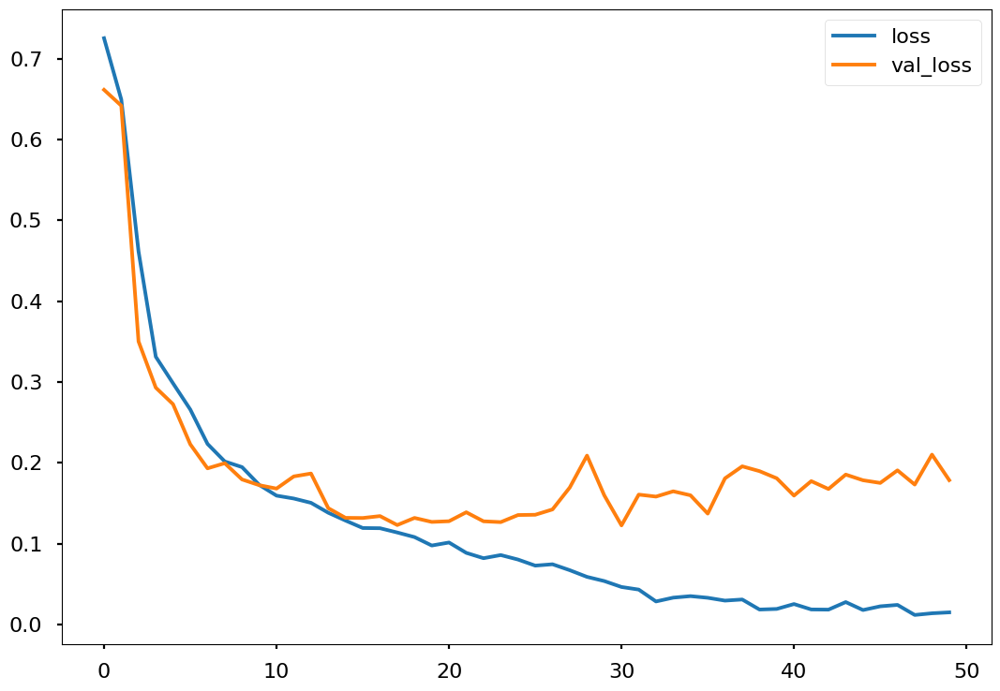

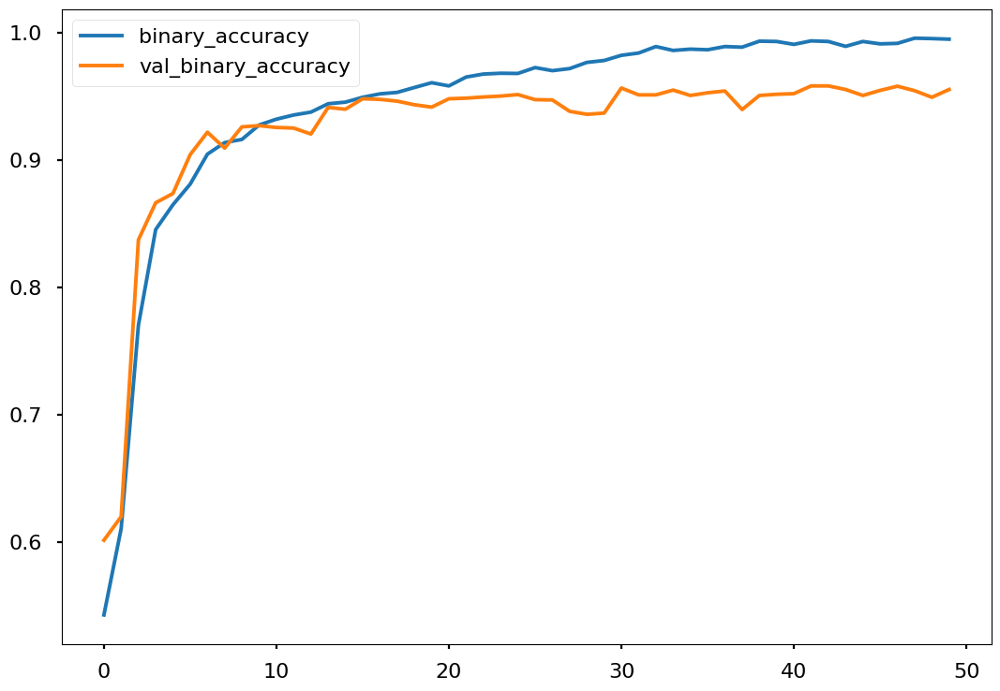

Epoch 1/50
100/100 [==============================] - 41s 362ms/step - loss: 0.7115 - binary_accuracy: 0.5316 - precision_2: 0.4869 - recall_2: 0.2359 - specificity: 0.5343 - f1_m: 0.2765 - val_loss: 0.6824 - val_binary_accuracy: 0.6013 - val_precision_2: 0.6848 - val_recall_2: 0.2560 - val_specificity: 0.5272 - val_f1_m: 0.3742
Epoch 2/50
100/100 [==============================] - 36s 355ms/step - loss: 0.6610 - binary_accuracy: 0.5929 - precision_2: 0.6190 - recall_2: 0.3114 - specificity: 0.5589 - f1_m: 0.4026 - val_loss: 0.6234 - val_binary_accuracy: 0.6081 - val_precision_2: 0.7348 - val_recall_2: 0.2392 - val_specificity: 0.6166 - val_f1_m: 0.3622
Epoch 3/50
100/100 [==============================] - 35s 355ms/step - loss: 0.4575 - binary_accuracy: 0.7732 - precision_2: 0.8287 - recall_2: 0.6423 - specificity: 0.7130 - f1_m: 0.7143 - val_loss: 0.3558 - val_binary_accuracy: 0.8191 - val_precision_2: 0.9886 - val_recall_2: 0.6160 - val_specificity: 0.8436 - val_f1_m: 0.7525
Epoch 4

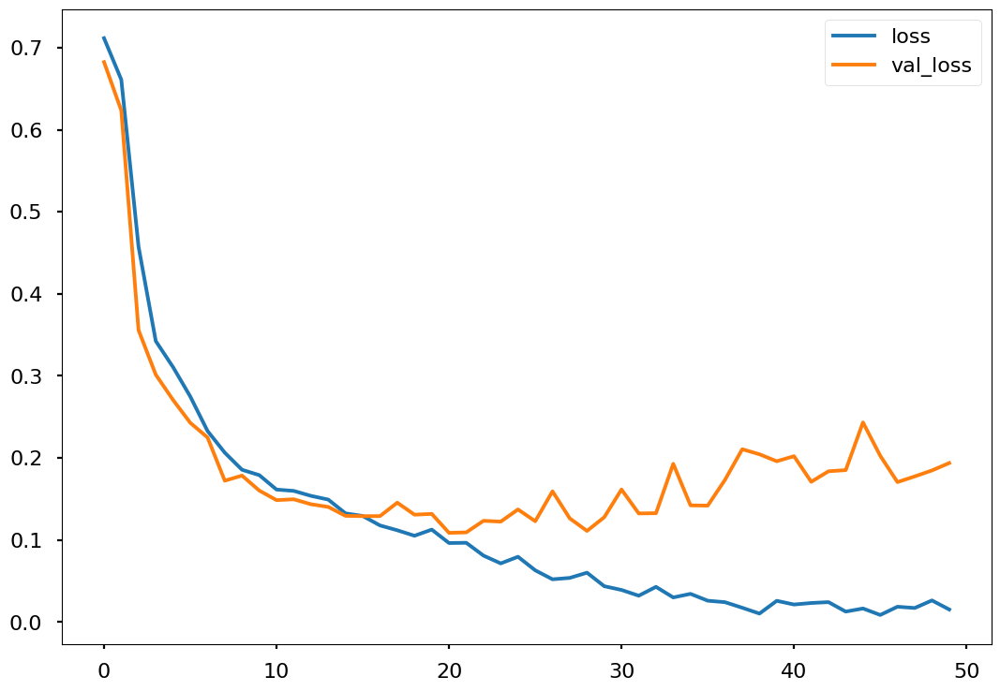

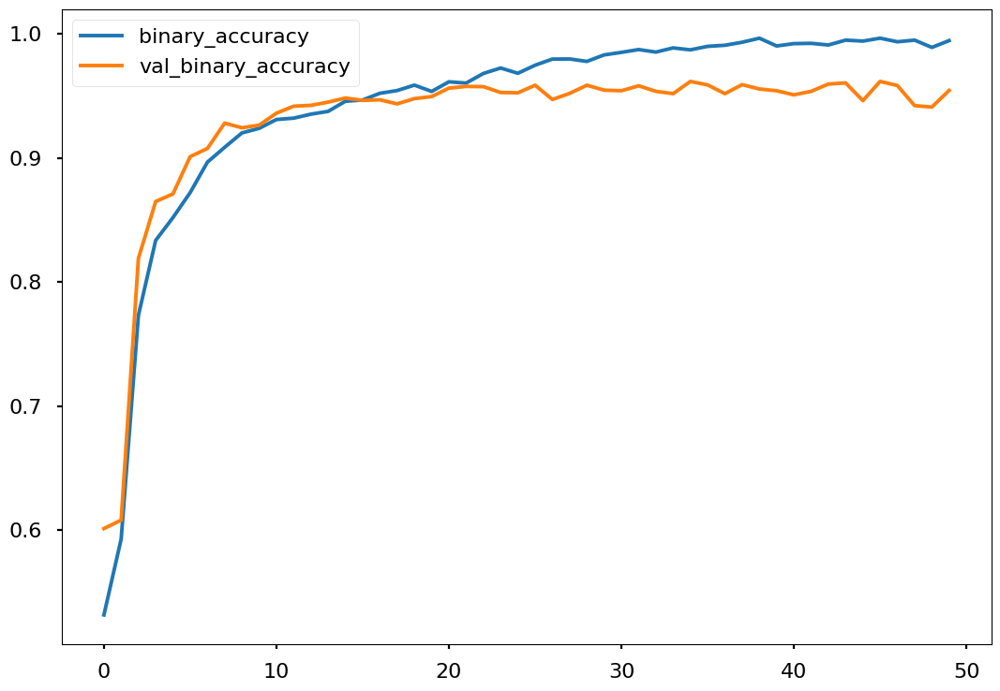

Epoch 1/50
100/100 [==============================] - 40s 361ms/step - loss: 0.7213 - binary_accuracy: 0.5327 - precision_3: 0.4900 - recall_3: 0.2569 - specificity: 0.5404 - f1_m: 0.3047 - val_loss: 0.6732 - val_binary_accuracy: 0.5907 - val_precision_3: 0.6587 - val_recall_3: 0.2392 - val_specificity: 0.5691 - val_f1_m: 0.3489
Epoch 2/50
100/100 [==============================] - 35s 355ms/step - loss: 0.6658 - binary_accuracy: 0.5937 - precision_3: 0.6050 - recall_3: 0.3497 - specificity: 0.5586 - f1_m: 0.4276 - val_loss: 0.6526 - val_binary_accuracy: 0.6191 - val_precision_3: 0.6259 - val_recall_3: 0.4393 - val_specificity: 0.5158 - val_f1_m: 0.5150
Epoch 3/50
100/100 [==============================] - 35s 355ms/step - loss: 0.5218 - binary_accuracy: 0.7253 - precision_3: 0.7800 - recall_3: 0.5656 - specificity: 0.6647 - f1_m: 0.6452 - val_loss: 0.3845 - val_binary_accuracy: 0.8137 - val_precision_3: 0.8879 - val_recall_3: 0.6836 - val_specificity: 0.7237 - val_f1_m: 0.7702
Epoch 4

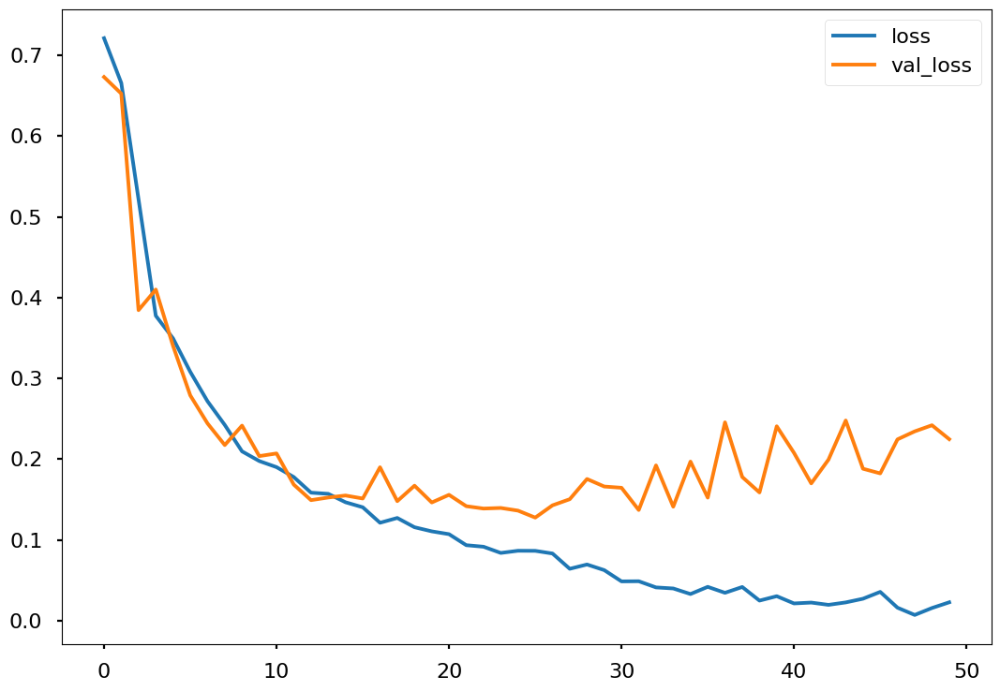

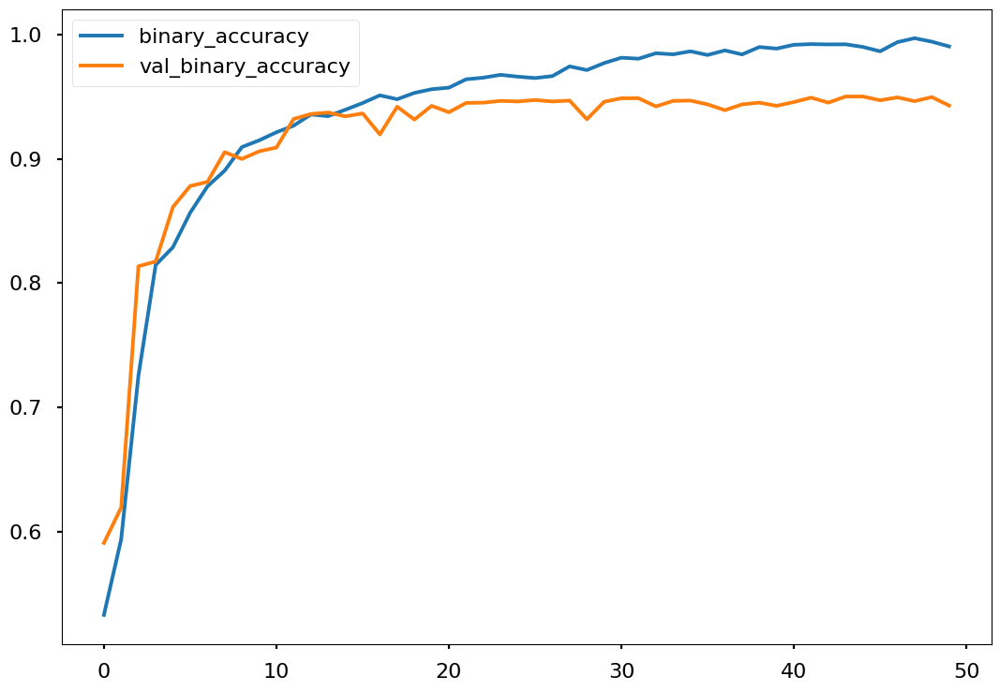

Epoch 1/50
100/100 [==============================] - 41s 362ms/step - loss: 0.7929 - binary_accuracy: 0.5242 - precision_4: 0.4726 - recall_4: 0.2483 - specificity: 0.5354 - f1_m: 0.2909 - val_loss: 0.6900 - val_binary_accuracy: 0.6125 - val_precision_4: 0.5900 - val_recall_4: 0.5315 - val_specificity: 0.5010 - val_f1_m: 0.5564
Epoch 2/50
100/100 [==============================] - 35s 355ms/step - loss: 0.6821 - binary_accuracy: 0.5602 - precision_4: 0.5428 - recall_4: 0.3106 - specificity: 0.5393 - f1_m: 0.3662 - val_loss: 0.6771 - val_binary_accuracy: 0.5963 - val_precision_4: 0.6786 - val_recall_4: 0.2414 - val_specificity: 0.6102 - val_f1_m: 0.3519
Epoch 3/50
100/100 [==============================] - 35s 355ms/step - loss: 0.6284 - binary_accuracy: 0.6378 - precision_4: 0.6823 - recall_4: 0.4059 - specificity: 0.5916 - f1_m: 0.4855 - val_loss: 0.4462 - val_binary_accuracy: 0.7848 - val_precision_4: 0.8321 - val_recall_4: 0.6697 - val_specificity: 0.6804 - val_f1_m: 0.7418
Epoch 4

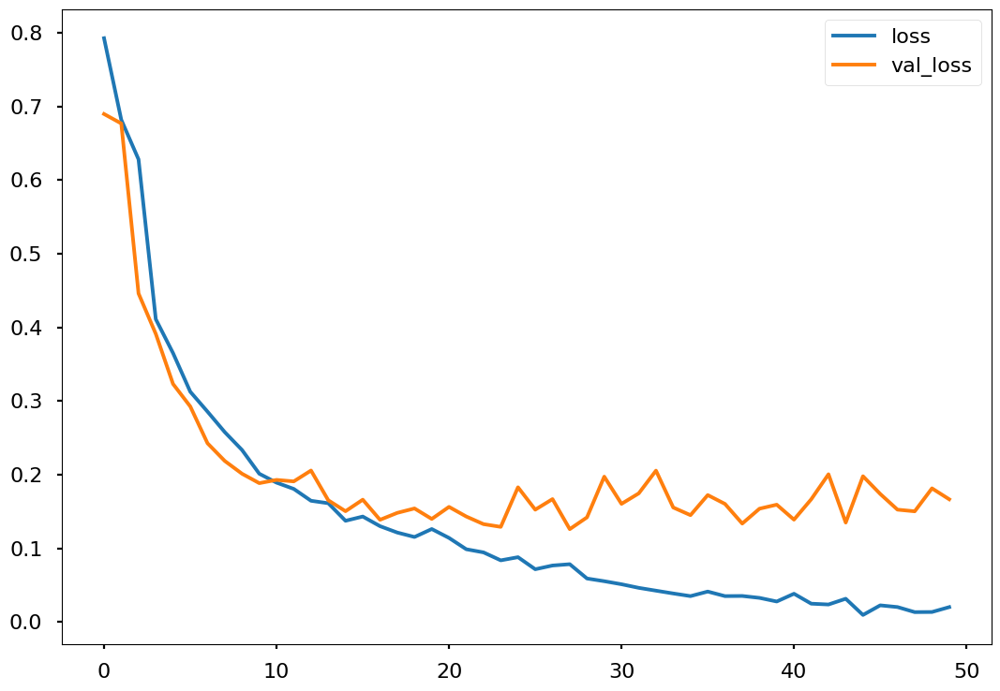

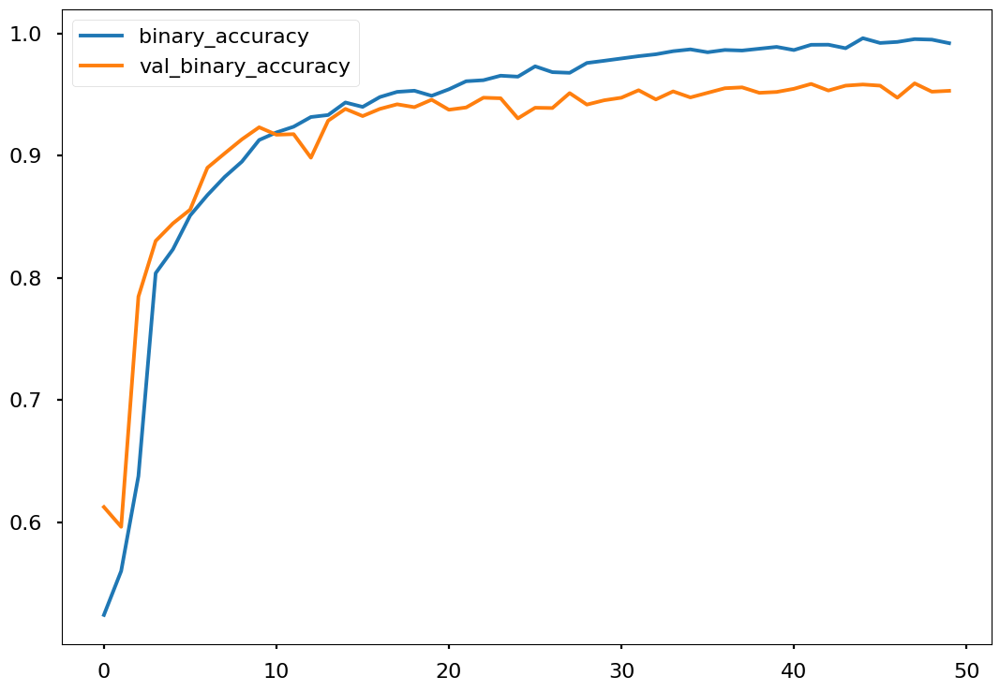

Epoch 1/50
100/100 [==============================] - 41s 362ms/step - loss: 0.7415 - binary_accuracy: 0.5363 - precision_5: 0.4976 - recall_5: 0.2689 - specificity: 0.5369 - f1_m: 0.3188 - val_loss: 0.6781 - val_binary_accuracy: 0.5949 - val_precision_5: 0.6627 - val_recall_5: 0.2525 - val_specificity: 0.5371 - val_f1_m: 0.3600
Epoch 2/50
100/100 [==============================] - 36s 355ms/step - loss: 0.6674 - binary_accuracy: 0.5955 - precision_5: 0.6095 - recall_5: 0.3487 - specificity: 0.5592 - f1_m: 0.4273 - val_loss: 0.6404 - val_binary_accuracy: 0.6360 - val_precision_5: 0.6335 - val_recall_5: 0.5051 - val_specificity: 0.5444 - val_f1_m: 0.5587
Epoch 3/50
100/100 [==============================] - 36s 355ms/step - loss: 0.4714 - binary_accuracy: 0.7531 - precision_5: 0.7806 - recall_5: 0.6483 - specificity: 0.6997 - f1_m: 0.7046 - val_loss: 0.3349 - val_binary_accuracy: 0.8315 - val_precision_5: 0.8532 - val_recall_5: 0.7678 - val_specificity: 0.7594 - val_f1_m: 0.8091
Epoch 4

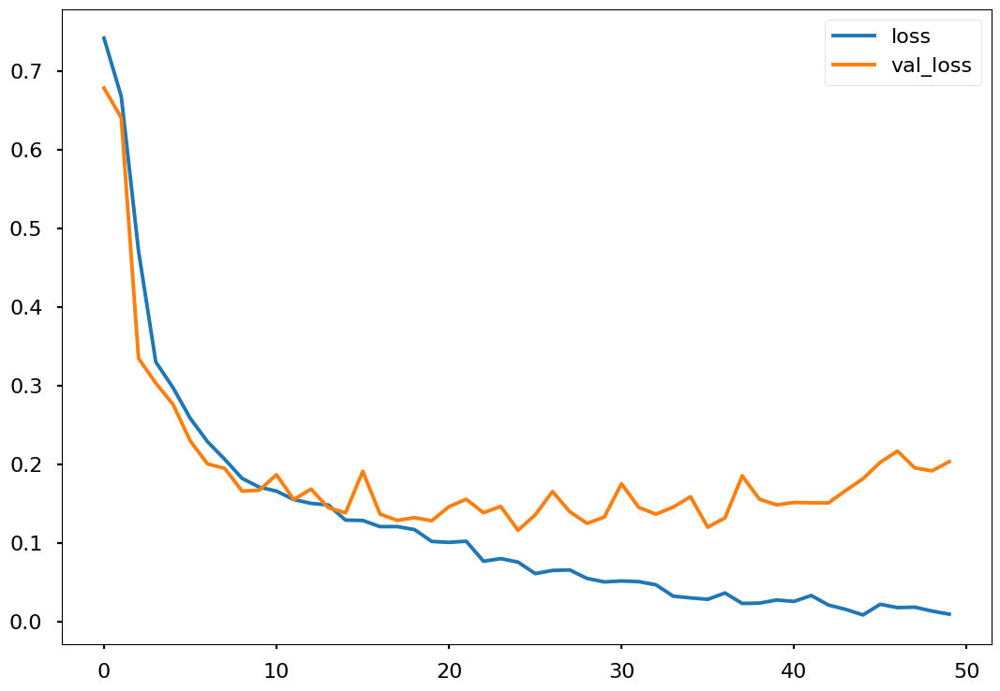

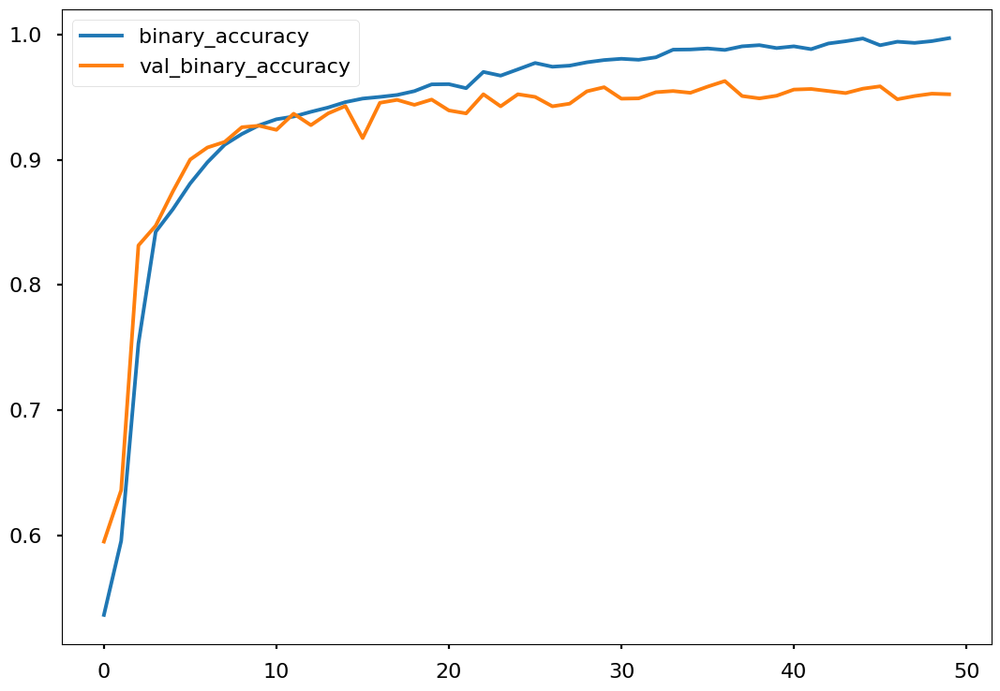

In [ ]:
# order 5 (4 - 45), AdamW, Notched 50Hz, Spectrogram, 20 sec seg, z score

accuracy = []
precision = []
recall = []
spec = []
f1 = []

i = 1

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    # if i<=1:
    #     i+=1
    #     continue
    optimizer1 = Adam(learning_rate=0.0001)
    optimizer2 = RMSprop(learning_rate=0.00001)
    optimizer3 = SGD(learning_rate=0.0001)
    optimizer4 = Adafactor(learning_rate=0.0001)
    optimizer5 = AdamW(learning_rate=0.0001)

    train_features, train_labels = nspec_data_array[train_index], labels_array[train_index]
    test_features, test_labels = nspec_data_array[test_index], labels_array[test_index]

    train_features, val_features, train_labels, val_labels = train_test_split(train_features, train_labels, test_size=0.25, stratify=train_labels)

    model = Vgg16_model((112, 112, 3))
    model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

    history = model.fit(
        train_features, train_labels,
        epochs = 50,
        batch_size = 128,
        validation_data = (val_features,val_labels),
        #callbacks=[early_stopping]
    )

    res = model.evaluate(test_features,test_labels)

    accuracy.append(res[1])
    precision.append(res[2])
    recall.append(res[3])
    spec.append(res[4])
    f1.append(res[5])

    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
    plt.show()

    # break

In [ ]:
print(sum(accuracy)/len(accuracy)), print(sum(precision)/len(accuracy)), print(sum(recall)/len(accuracy)), print(sum(spec)/len(accuracy)), print(sum(f1)/len(accuracy))

0.9500939846038818
0.9524069786071777
0.939440393447876
0.5180673599243164
0.4501206576824188


(None, None, None, None, None)

Epoch 1/30
285/285 [==============================] - 7s 21ms/step - loss: 0.6243 - binary_accuracy: 0.7596 - val_loss: 0.3468 - val_binary_accuracy: 0.8372
Epoch 2/30
285/285 [==============================] - 6s 20ms/step - loss: 0.2421 - binary_accuracy: 0.8955 - val_loss: 0.1635 - val_binary_accuracy: 0.9299
Epoch 3/30
285/285 [==============================] - 6s 20ms/step - loss: 0.1838 - binary_accuracy: 0.9236 - val_loss: 0.1286 - val_binary_accuracy: 0.9467
Epoch 4/30
285/285 [==============================] - 6s 20ms/step - loss: 0.1692 - binary_accuracy: 0.9310 - val_loss: 0.2100 - val_binary_accuracy: 0.9099
Epoch 5/30
285/285 [==============================] - 6s 20ms/step - loss: 0.1419 - binary_accuracy: 0.9405 - val_loss: 0.1299 - val_binary_accuracy: 0.9516
Epoch 6/30
285/285 [==============================] - 6s 20ms/step - loss: 0.1292 - binary_accuracy: 0.9468 - val_loss: 0.3914 - val_binary_accuracy: 0.8398
Epoch 7/30
285/285 [==============================] - 6s 2

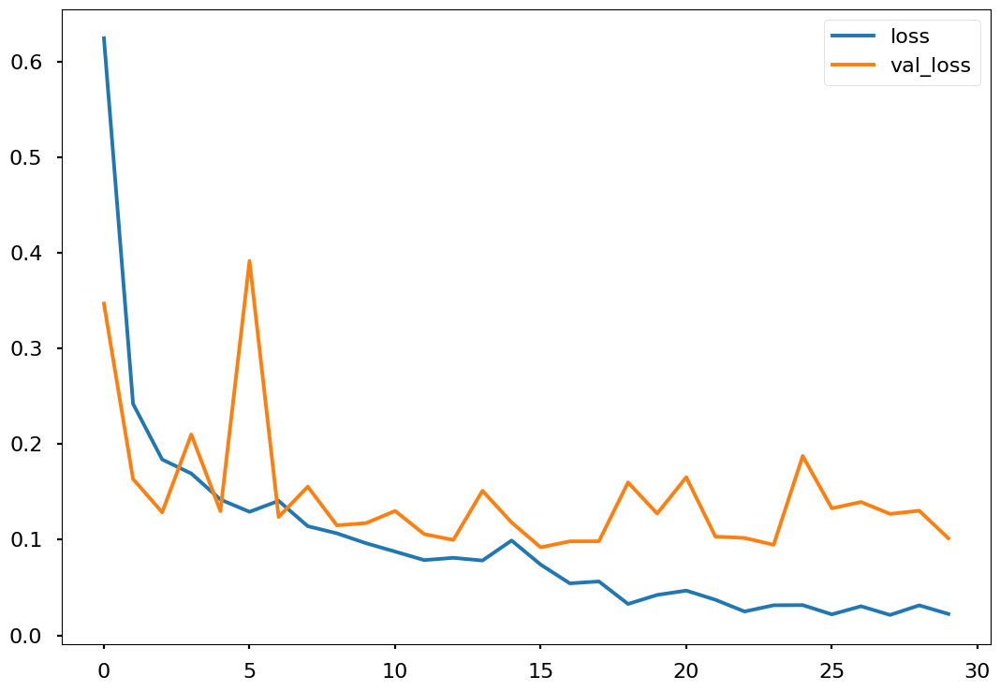

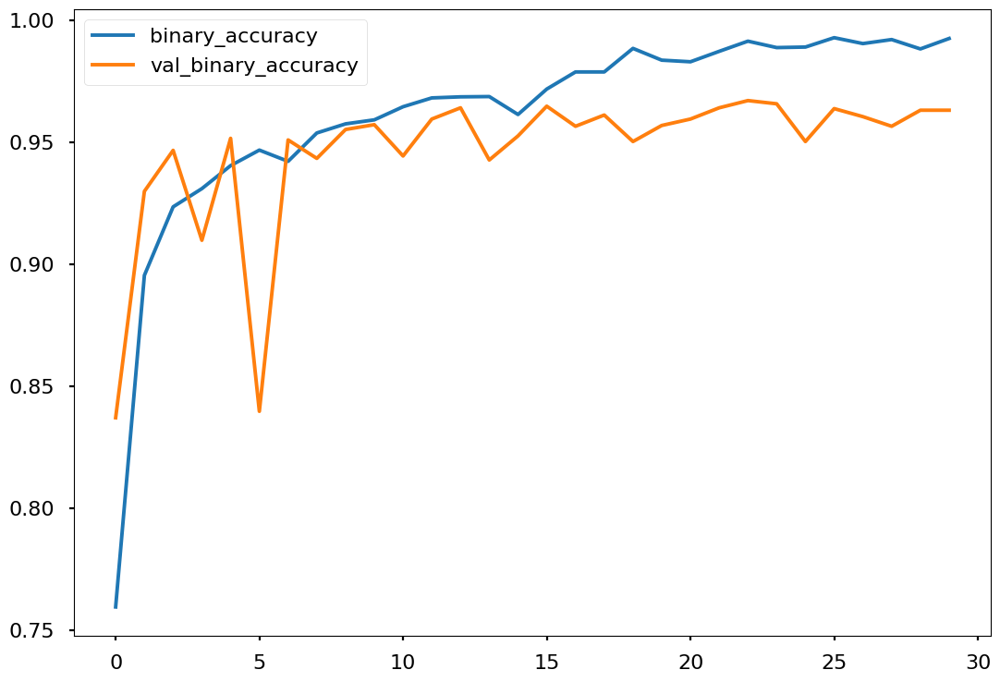

Epoch 1/30
285/285 [==============================] - 7s 21ms/step - loss: 1.4161 - binary_accuracy: 0.5363 - val_loss: 0.6926 - val_binary_accuracy: 0.5375
Epoch 2/30
285/285 [==============================] - 6s 19ms/step - loss: 0.6924 - binary_accuracy: 0.5375 - val_loss: 0.6922 - val_binary_accuracy: 0.5375
Epoch 3/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6920 - binary_accuracy: 0.5375 - val_loss: 0.6919 - val_binary_accuracy: 0.5375
Epoch 4/30
285/285 [==============================] - 6s 19ms/step - loss: 0.6917 - binary_accuracy: 0.5375 - val_loss: 0.6916 - val_binary_accuracy: 0.5375
Epoch 5/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6915 - binary_accuracy: 0.5375 - val_loss: 0.6914 - val_binary_accuracy: 0.5375
Epoch 6/30
285/285 [==============================] - 6s 19ms/step - loss: 0.6913 - binary_accuracy: 0.5375 - val_loss: 0.6913 - val_binary_accuracy: 0.5375
Epoch 7/30
285/285 [==============================] - 6s 2

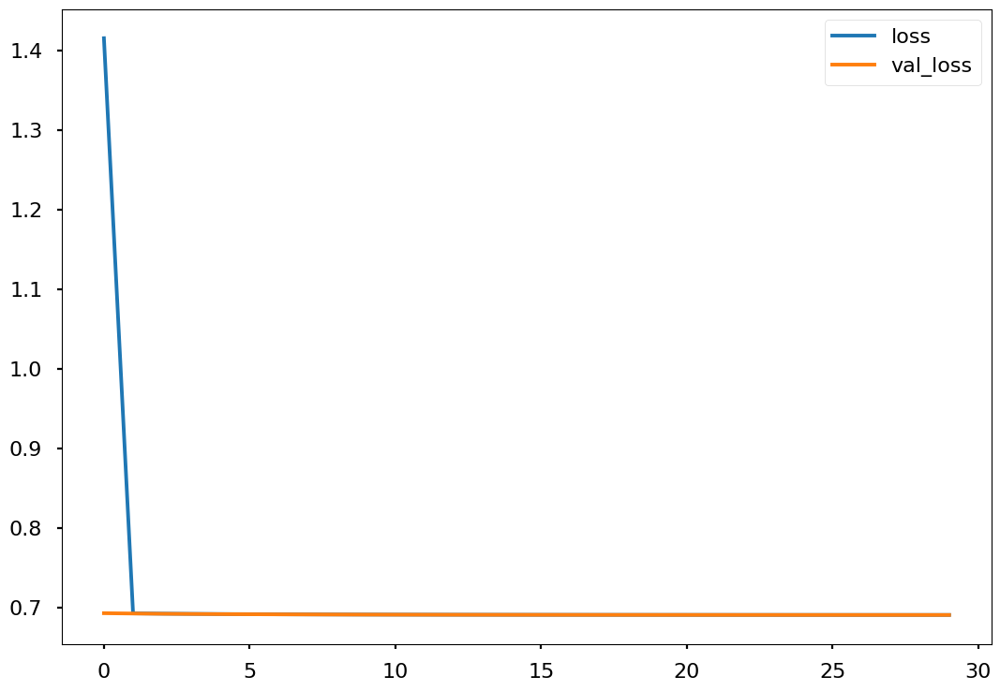

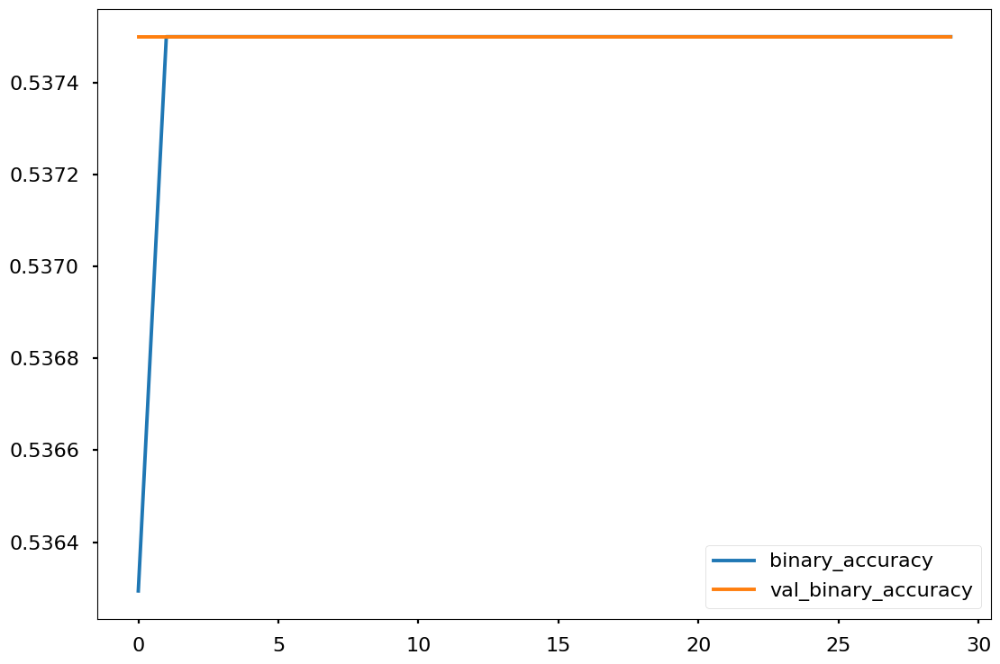

Epoch 1/30
285/285 [==============================] - 7s 21ms/step - loss: 1.2809 - binary_accuracy: 0.5355 - val_loss: 0.6925 - val_binary_accuracy: 0.5375
Epoch 2/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6923 - binary_accuracy: 0.5375 - val_loss: 0.6921 - val_binary_accuracy: 0.5375
Epoch 3/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6920 - binary_accuracy: 0.5375 - val_loss: 0.6919 - val_binary_accuracy: 0.5375
Epoch 4/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6917 - binary_accuracy: 0.5375 - val_loss: 0.6916 - val_binary_accuracy: 0.5375
Epoch 5/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6915 - binary_accuracy: 0.5375 - val_loss: 0.6914 - val_binary_accuracy: 0.5375
Epoch 6/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6913 - binary_accuracy: 0.5375 - val_loss: 0.6912 - val_binary_accuracy: 0.5375
Epoch 7/30
285/285 [==============================] - 6s 2

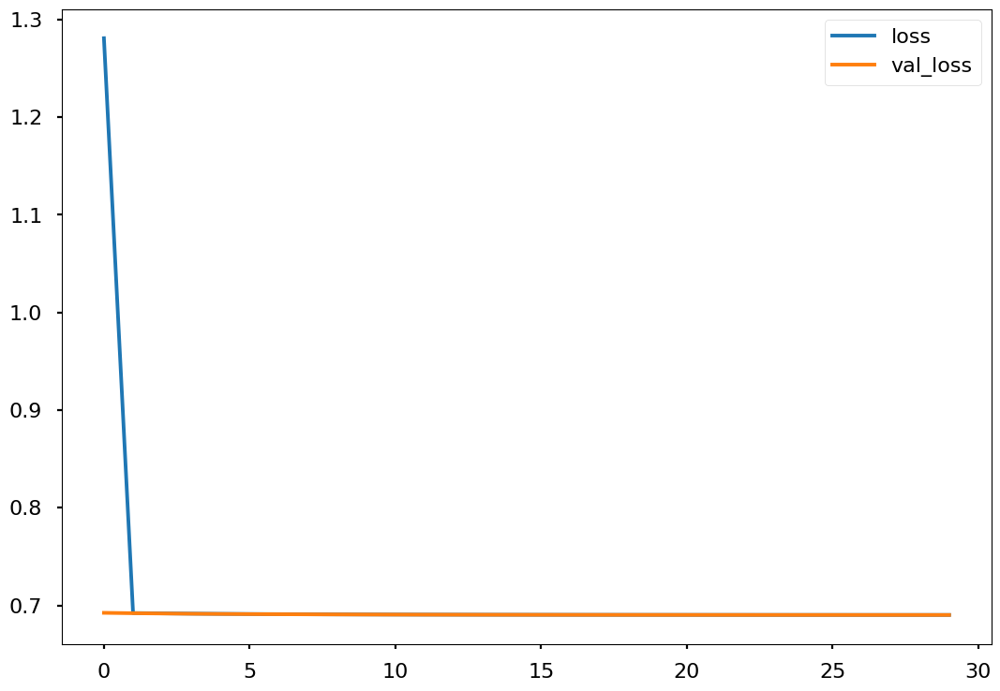

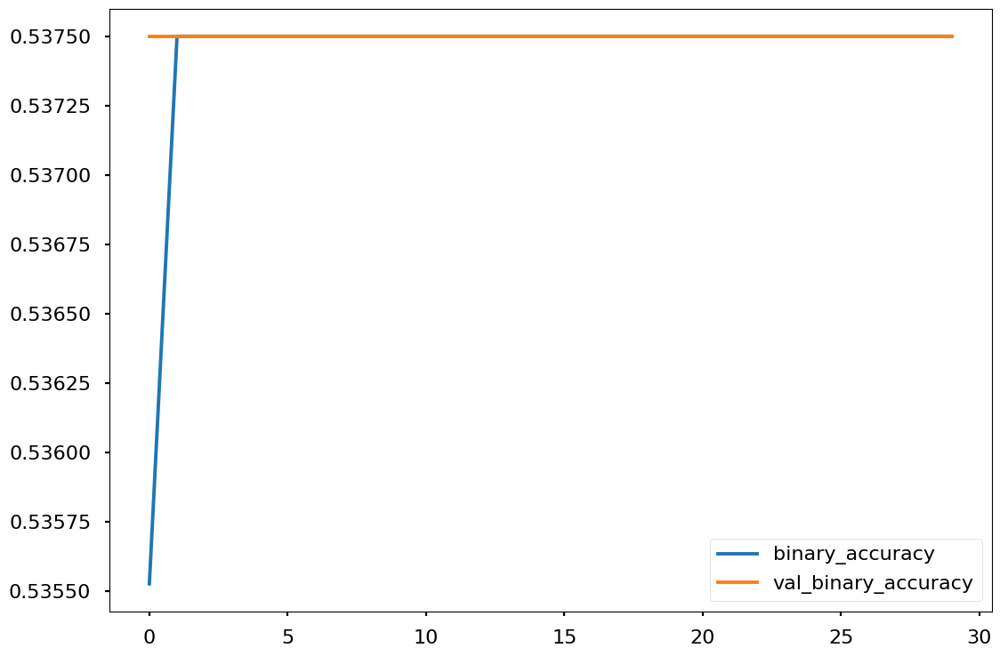

Epoch 1/30
285/285 [==============================] - 7s 21ms/step - loss: 1.8141 - binary_accuracy: 0.5316 - val_loss: 0.6926 - val_binary_accuracy: 0.5375
Epoch 2/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6924 - binary_accuracy: 0.5375 - val_loss: 0.6922 - val_binary_accuracy: 0.5375
Epoch 3/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6921 - binary_accuracy: 0.5375 - val_loss: 0.6919 - val_binary_accuracy: 0.5375
Epoch 4/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6918 - binary_accuracy: 0.5375 - val_loss: 0.6917 - val_binary_accuracy: 0.5375
Epoch 5/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6916 - binary_accuracy: 0.5375 - val_loss: 0.6915 - val_binary_accuracy: 0.5375
Epoch 6/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6914 - binary_accuracy: 0.5375 - val_loss: 0.6913 - val_binary_accuracy: 0.5375
Epoch 7/30
285/285 [==============================] - 6s 2

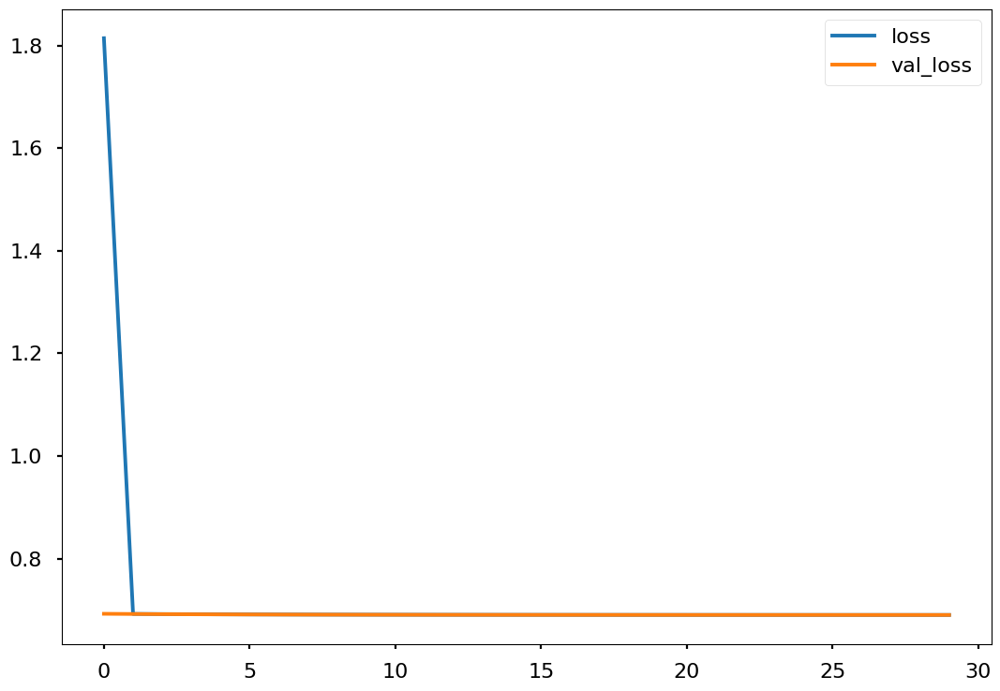

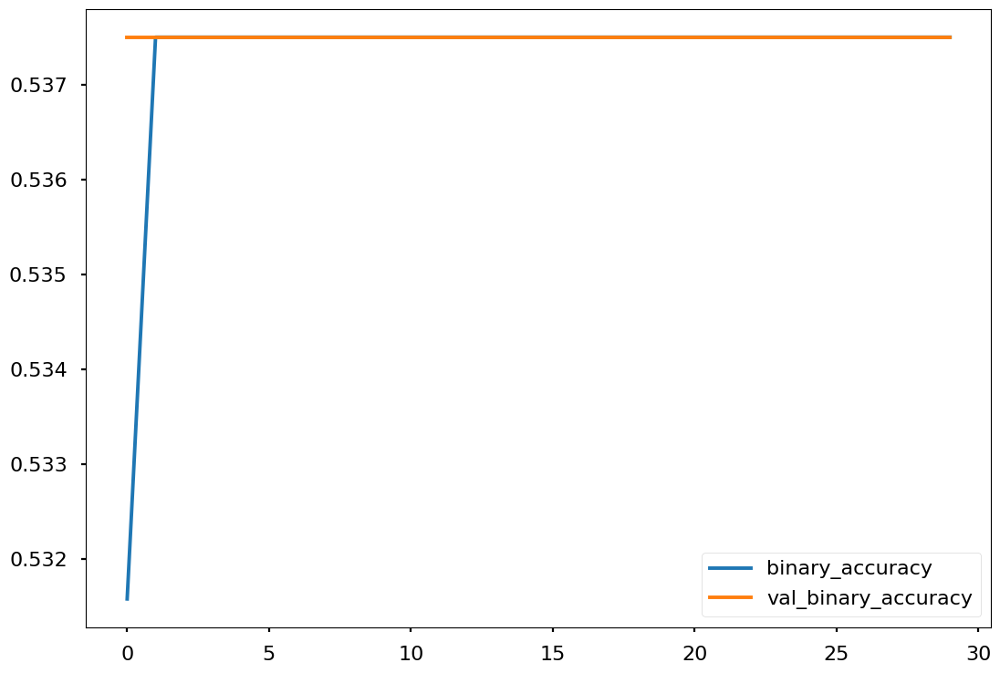

Epoch 1/30
285/285 [==============================] - 7s 21ms/step - loss: 1.0716 - binary_accuracy: 0.5287 - val_loss: 0.6926 - val_binary_accuracy: 0.5375
Epoch 2/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6924 - binary_accuracy: 0.5375 - val_loss: 0.6922 - val_binary_accuracy: 0.5375
Epoch 3/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6920 - binary_accuracy: 0.5375 - val_loss: 0.6919 - val_binary_accuracy: 0.5375
Epoch 4/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6917 - binary_accuracy: 0.5375 - val_loss: 0.6916 - val_binary_accuracy: 0.5375
Epoch 5/30
285/285 [==============================] - 6s 20ms/step - loss: 0.6915 - binary_accuracy: 0.5375 - val_loss: 0.6914 - val_binary_accuracy: 0.5375
Epoch 6/30
285/285 [==============================] - 6s 19ms/step - loss: 0.6913 - binary_accuracy: 0.5375 - val_loss: 0.6912 - val_binary_accuracy: 0.5375
Epoch 7/30
285/285 [==============================] - 6s 2

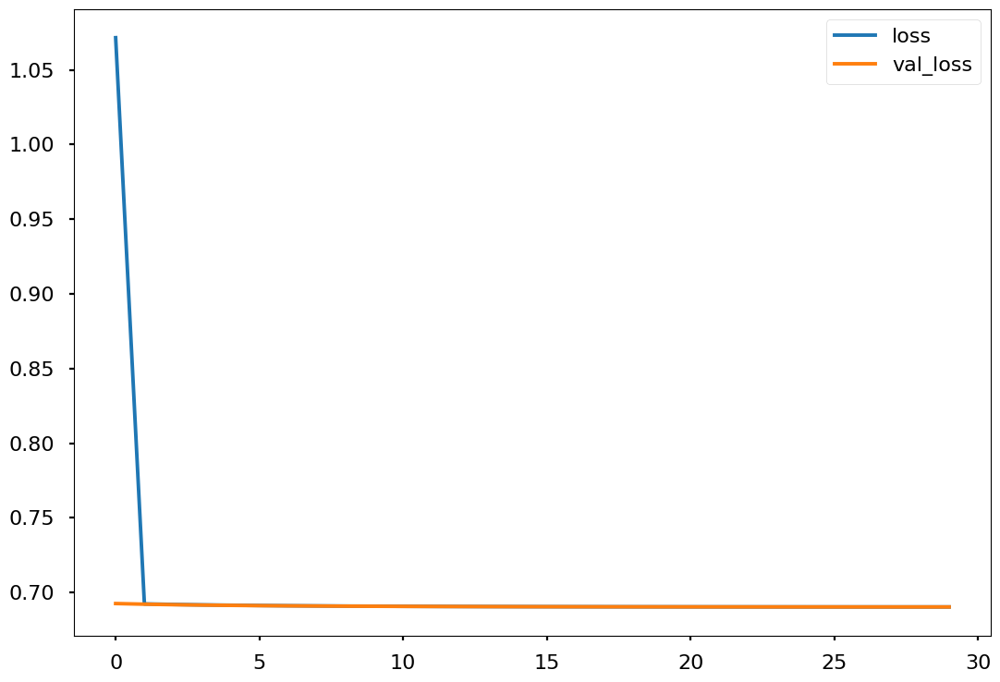

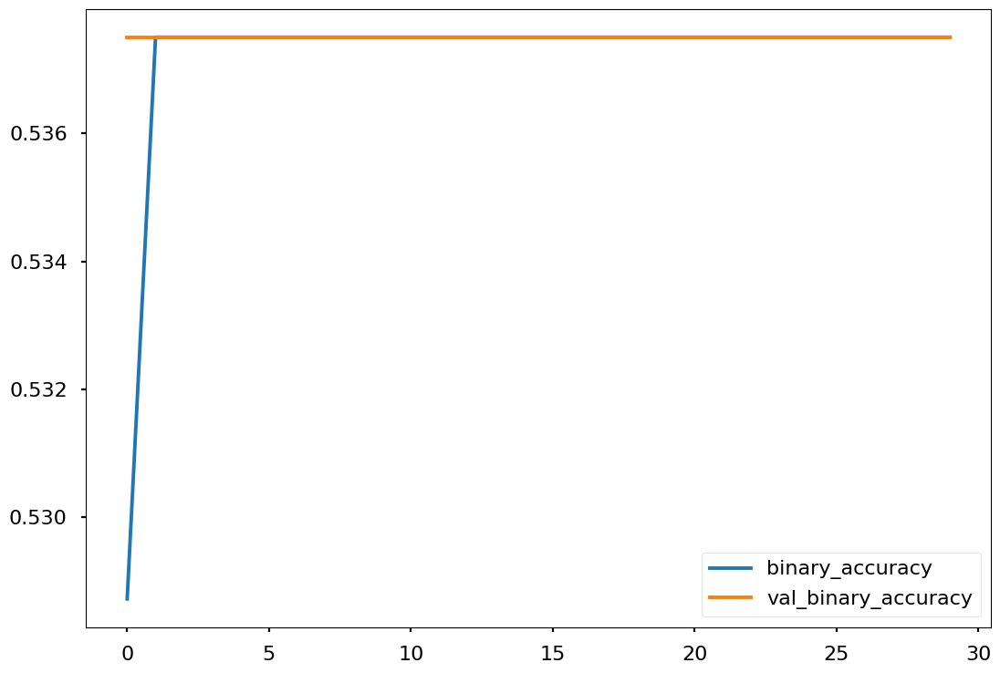

In [ ]:
#10

accuracy=[]
optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.00001)

Skf = StratifiedKFold(random_state=1, shuffle=True)

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    train_features, train_labels = nspec_data_array[train_index], labels_array[train_index]
    test_features, test_labels = nspec_data_array[test_index], labels_array[test_index]

    train_features, val_features, train_labels, val_labels = train_test_split(train_features, train_labels, test_size=0.25, stratify=train_labels)

    model = Vgg16_model((112, 112, 3))
    model.compile(optimizer1, loss='binary_crossentropy', metrics=['binary_accuracy'])

    history = model.fit(
        train_features, train_labels,
        epochs = 30,
        batch_size = 32,
        validation_data = (val_features,val_labels),
        #callbacks=[early_stopping]
    )

    res = model.evaluate(test_features,test_labels)

    accuracy.append(res[1])

    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
    plt.show()


In [ ]:
print(sum(accuracy)/len(accuracy))

0.6227631807327271


Epoch 1/30
798/798 [==============================] - 106s 118ms/step - loss: 0.8177 - binary_accuracy: 0.5365 - val_loss: 0.6639 - val_binary_accuracy: 0.6190
Epoch 2/30
798/798 [==============================] - 98s 123ms/step - loss: 0.5684 - binary_accuracy: 0.6823 - val_loss: 0.4754 - val_binary_accuracy: 0.7459
Epoch 3/30
798/798 [==============================] - 98s 123ms/step - loss: 0.5013 - binary_accuracy: 0.7386 - val_loss: 0.4030 - val_binary_accuracy: 0.8113
Epoch 4/30
798/798 [==============================] - 98s 123ms/step - loss: 0.3502 - binary_accuracy: 0.8371 - val_loss: 0.3260 - val_binary_accuracy: 0.8516
Epoch 5/30
798/798 [==============================] - 98s 122ms/step - loss: 0.3106 - binary_accuracy: 0.8599 - val_loss: 0.2893 - val_binary_accuracy: 0.8687
Epoch 6/30
798/798 [==============================] - 98s 123ms/step - loss: 0.2704 - binary_accuracy: 0.8821 - val_loss: 0.2651 - val_binary_accuracy: 0.8859
Epoch 7/30
798/798 [=========================

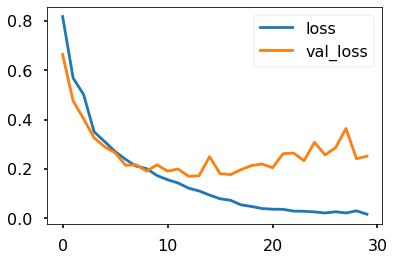

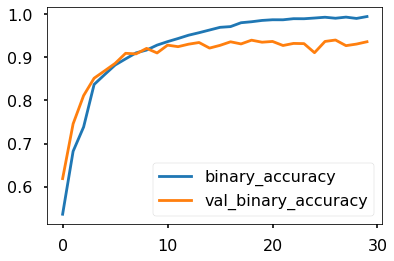

Epoch 1/30
798/798 [==============================] - 98s 121ms/step - loss: 0.9544 - binary_accuracy: 0.5334 - val_loss: 0.6879 - val_binary_accuracy: 0.5653
Epoch 2/30
798/798 [==============================] - 95s 120ms/step - loss: 0.6866 - binary_accuracy: 0.5526 - val_loss: 0.6929 - val_binary_accuracy: 0.5375
Epoch 3/30
798/798 [==============================] - 93s 117ms/step - loss: 0.6924 - binary_accuracy: 0.5375 - val_loss: 0.6920 - val_binary_accuracy: 0.5375
Epoch 4/30
798/798 [==============================] - 93s 117ms/step - loss: 0.6917 - binary_accuracy: 0.5375 - val_loss: 0.6914 - val_binary_accuracy: 0.5375
Epoch 5/30
798/798 [==============================] - 93s 117ms/step - loss: 0.6912 - binary_accuracy: 0.5375 - val_loss: 0.6910 - val_binary_accuracy: 0.5375
Epoch 6/30
798/798 [==============================] - 93s 117ms/step - loss: 0.6909 - binary_accuracy: 0.5375 - val_loss: 0.6908 - val_binary_accuracy: 0.5375
Epoch 7/30
798/798 [==========================

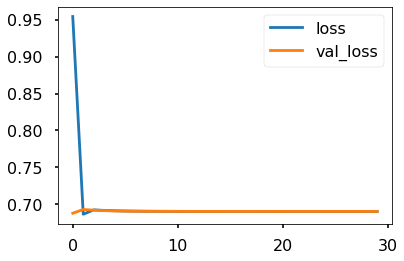

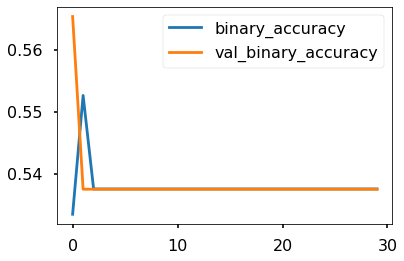

Epoch 1/30
798/798 [==============================] - 95s 118ms/step - loss: 0.8108 - binary_accuracy: 0.5359 - val_loss: 0.6919 - val_binary_accuracy: 0.5375
Epoch 2/30
798/798 [==============================] - 94s 117ms/step - loss: 0.6916 - binary_accuracy: 0.5375 - val_loss: 0.6913 - val_binary_accuracy: 0.5375
Epoch 3/30
798/798 [==============================] - 94s 117ms/step - loss: 0.6911 - binary_accuracy: 0.5375 - val_loss: 0.6909 - val_binary_accuracy: 0.5375
Epoch 4/30
429/798 [===============>..............] - ETA: 39s - loss: 0.6911 - binary_accuracy: 0.5350

In [ ]:
accuracy=[]
optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.00001)

Skf = StratifiedKFold(random_state=1, shuffle=True)

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    train_features, train_labels = nspec_data_array[train_index], labels_array[train_index]
    test_features, test_labels = nspec_data_array[test_index], labels_array[test_index]

    train_features, val_features, train_labels, val_labels = train_test_split(train_features, train_labels, test_size=0.25, stratify=train_labels)

    model = Vgg16_model((112, 112, 3))
    model.compile(optimizer1, loss='binary_crossentropy', metrics=['binary_accuracy'])

    history = model.fit(
        train_features, train_labels,
        epochs = 30,
        batch_size = 32,
        validation_data = (val_features,val_labels),
        #callbacks=[early_stopping]
    )

    res = model.evaluate(test_features,test_labels)

    accuracy.append(res[1])

    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
    plt.show()

In [ ]:
print(sum(accuracy)/len(accuracy))

In [ ]:
# VGG16 for (112, 112, 3) full dataset

optimizer1 = Adam(learning_rate=0.001)
optimizer2 = RMSprop(learning_rate=0.00001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer1, loss='binary_crossentropy', metrics=['binary_accuracy'])

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 50,
    validation_data = (X_val_shuffled, y_val_shuffled),
    #callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

Epoch 1/50
73/73 [==============================] - 27s 195ms/step - loss: 6.0069 - binary_accuracy: 0.4952 - val_loss: 0.6929 - val_binary_accuracy: 0.5371
Epoch 2/50
73/73 [==============================] - 12s 165ms/step - loss: 0.6926 - binary_accuracy: 0.5376 - val_loss: 0.6924 - val_binary_accuracy: 0.5371
Epoch 3/50
73/73 [==============================] - 12s 166ms/step - loss: 0.6921 - binary_accuracy: 0.5376 - val_loss: 0.6919 - val_binary_accuracy: 0.5371
Epoch 4/50
73/73 [==============================] - 12s 167ms/step - loss: 0.6917 - binary_accuracy: 0.5376 - val_loss: 0.6915 - val_binary_accuracy: 0.5371
Epoch 5/50
73/73 [==============================] - 12s 168ms/step - loss: 0.6913 - binary_accuracy: 0.5376 - val_loss: 0.6912 - val_binary_accuracy: 0.5371
Epoch 6/50
63/73 [========================>.....] - ETA: 1s - loss: 0.6909 - binary_accuracy: 0.5394

KeyboardInterrupt: ignored

# Vision Transformer

## Hugging Face

In [ ]:
from datasets import Dataset

In [ ]:
im_X_train = [Image.fromarray(x) for x in X_train]
im_X_val = [Image.fromarray(x) for x in X_val]
im_X_test = [Image.fromarray(x) for x in X_test]

In [ ]:
dict_train = {
    "img" : im_X_train,
    "label" : y_train
    }
dict_val = {
    "img" : im_X_val,
    "label" : y_val
    }
dict_test = {
    "img" : im_X_test,
    "label" : y_test
    }

In [ ]:
dataset_train = Dataset.from_dict(dict_train)
dataset_val = Dataset.from_dict(dict_val)
dataset_test = Dataset.from_dict(dict_test)

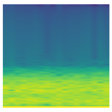

In [ ]:
dataset_train[0]['img']

In [ ]:
dataset_train[0]['label']

0

In [ ]:
labels = ["healthy", "patient"]

In [ ]:
from transformers import ViTFeatureExtractor

# import model
model_id = 'google/vit-base-patch16-224-in21k'
feature_extractor = ViTFeatureExtractor.from_pretrained(
    model_id
)

/usr/local/lib/python3.8/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


In [ ]:
feature_extractor

ViTFeatureExtractor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTFeatureExtractor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [ ]:
# load in relevant libraries, and alias where appropriate
import torch

# device will determine whether to run the training on GPU or CPU.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
def preprocess(batch):
    # take a list of PIL images and turn them to pixel values
    inputs = feature_extractor(
        batch['img'],
        return_tensors='pt'
    )
    # include the labels
    inputs['label'] = batch['label']
    return inputs

In [ ]:
# transform the training dataset
prepared_train = dataset_train.with_transform(preprocess)
# ... and the validation dataset
prepared_val = dataset_val.with_transform(preprocess)
# ... and the testing dataset
prepared_test = dataset_test.with_transform(preprocess)

In [ ]:
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['label'] for x in batch])
    }

In [ ]:
import numpy as np
from datasets import load_metric

# accuracy metric
metric = load_metric("accuracy")
def compute_metrics(p):
    return metric.compute(
        predictions=np.argmax(p.predictions, axis=1),
        references=p.label_ids
    )

<ipython-input-60-b7bbca42f0bd>:5: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  metric = load_metric("accuracy")


In [ ]:
from transformers import TrainingArguments

training_args = TrainingArguments(
  output_dir="./phy",
  per_device_train_batch_size=16,
  evaluation_strategy="steps",
  num_train_epochs=4,
  save_steps=100,
  eval_steps=100,
  logging_steps=10,
  learning_rate=2e-4,
  save_total_limit=2,
  remove_unused_columns=False,
  push_to_hub=False,
  load_best_model_at_end=True,
)

In [ ]:
from transformers import ViTForImageClassification

model = ViTForImageClassification.from_pretrained(
    model_id,  # classification head
    num_labels=len(labels)
)

Some weights of the model checkpoint at google/vit-base-patch16-224-in21k were not used when initializing ViTForImageClassification: ['pooler.dense.bias', 'pooler.dense.weight']
- This IS expected if you are initializing ViTForImageClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing ViTForImageClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
model.to(device)

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0): ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_

In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=prepared_train,
    eval_dataset=prepared_val,
    tokenizer=feature_extractor,
)

In [ ]:
train_results = trainer.train()
# save tokenizer with the model
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
# save the trainer state
trainer.save_state()

/usr/local/lib/python3.8/dist-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
***** Running training *****
  Num examples = 34472
  Num Epochs = 4
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 8620
  Number of trainable parameters = 85800194


Step,Training Loss,Validation Loss,Accuracy
100,0.691600,0.697382,0.462542
200,0.695600,0.683206,0.577134
300,0.583100,0.542477,0.741843
400,1.033000,0.709254,0.476638
500,0.686800,0.688669,0.537458
600,0.647800,0.610058,0.677369
700,0.576000,0.561351,0.719394
800,0.536900,0.485332,0.766902
900,0.621600,0.511349,0.738972
1000,0.546600,0.468502,0.782824


***** Running Evaluation *****
  Num examples = 3831
  Batch size = 8
Saving model checkpoint to ./phy/checkpoint-100
Configuration saved in ./phy/checkpoint-100/config.json
Model weights saved in ./phy/checkpoint-100/pytorch_model.bin
Image processor saved in ./phy/checkpoint-100/preprocessor_config.json
***** Running Evaluation *****
  Num examples = 3831
  Batch size = 8
Saving model checkpoint to ./phy/checkpoint-200
Configuration saved in ./phy/checkpoint-200/config.json
Model weights saved in ./phy/checkpoint-200/pytorch_model.bin
Image processor saved in ./phy/checkpoint-200/preprocessor_config.json
***** Running Evaluation *****
  Num examples = 3831
  Batch size = 8
Saving model checkpoint to ./phy/checkpoint-300
Configuration saved in ./phy/checkpoint-300/config.json
Model weights saved in ./phy/checkpoint-300/pytorch_model.bin
Image processor saved in ./phy/checkpoint-300/preprocessor_config.json
Deleting older checkpoint [phy/checkpoint-100] due to args.save_total_limit
***

Step,Training Loss,Validation Loss,Accuracy
100,0.691600,0.697382,0.462542
200,0.695600,0.683206,0.577134
300,0.583100,0.542477,0.741843
400,1.033000,0.709254,0.476638
500,0.686800,0.688669,0.537458
600,0.647800,0.610058,0.677369
700,0.576000,0.561351,0.719394
800,0.536900,0.485332,0.766902
900,0.621600,0.511349,0.738972
1000,0.546600,0.468502,0.782824


***** Running Evaluation *****
  Num examples = 3831
  Batch size = 8
Saving model checkpoint to ./phy/checkpoint-2100
Configuration saved in ./phy/checkpoint-2100/config.json
Model weights saved in ./phy/checkpoint-2100/pytorch_model.bin
Image processor saved in ./phy/checkpoint-2100/preprocessor_config.json
Deleting older checkpoint [phy/checkpoint-2000] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 3831
  Batch size = 8
Saving model checkpoint to ./phy/checkpoint-2200
Configuration saved in ./phy/checkpoint-2200/config.json
Model weights saved in ./phy/checkpoint-2200/pytorch_model.bin
Image processor saved in ./phy/checkpoint-2200/preprocessor_config.json
Deleting older checkpoint [phy/checkpoint-2100] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 3831
  Batch size = 8
Saving model checkpoint to ./phy/checkpoint-2300
Configuration saved in ./phy/checkpoint-2300/config.json
Model weights saved in ./phy/checkpoint-2300/pyt

KeyboardInterrupt: ignored

In [ ]:
metrics = trainer.evaluate(prepared_test)
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

***** Running Evaluation *****
  Num examples = 8513
  Batch size = 8


***** eval metrics *****
  epoch                   =        4.0
  eval_accuracy           =     0.6213
  eval_loss               =     0.6302
  eval_runtime            = 0:00:43.45
  eval_samples_per_second =    195.915
  eval_steps_per_second   =     24.509


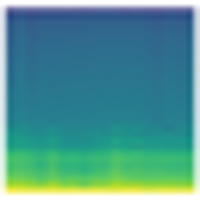

In [ ]:
# show the first image of the testing dataset
image = dataset_test["img"][0].resize((200,200))
image

In [ ]:
# extract the actual label of the first image of the testing dataset
actual_label = dataset_test["label"][0]

actual_label, labels[actual_label]

NameError: ignored

## Full train


In [ ]:
from tqdm import tqdm, trange

import torch
import torch.nn as nn
from torch.optim import Adam
from torch.nn import CrossEntropyLoss
from torch.utils.data import DataLoader, TensorDataset

np.random.seed(0)
torch.manual_seed(0)

In [ ]:
def patchify(images, n_patches):
    n, c, h, w = images.shape

    assert h == w, "Patchify method is implemented for square images only"

    patches = torch.zeros(n, n_patches ** 2, h * w * c // n_patches ** 2)
    patch_size = h // n_patches

    for idx, image in enumerate(images):
        for i in range(n_patches):
            for j in range(n_patches):
                patch = image[:, i * patch_size: (i + 1) * patch_size, j * patch_size: (j + 1) * patch_size]
                patches[idx, i * n_patches + j] = patch.flatten()
    return patches


class MyMSA(nn.Module):
    def __init__(self, d, n_heads=2):
        super(MyMSA, self).__init__()
        self.d = d
        self.n_heads = n_heads

        assert d % n_heads == 0, f"Can't divide dimension {d} into {n_heads} heads"

        d_head = int(d / n_heads)
        self.q_mappings = nn.ModuleList([nn.Linear(d_head, d_head) for _ in range(self.n_heads)])
        self.k_mappings = nn.ModuleList([nn.Linear(d_head, d_head) for _ in range(self.n_heads)])
        self.v_mappings = nn.ModuleList([nn.Linear(d_head, d_head) for _ in range(self.n_heads)])
        self.d_head = d_head
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, sequences):
        # Sequences has shape (N, seq_length, token_dim)
        # We go into shape    (N, seq_length, n_heads, token_dim / n_heads)
        # And come back to    (N, seq_length, item_dim)  (through concatenation)
        result = []
        for sequence in sequences:
            seq_result = []
            for head in range(self.n_heads):
                q_mapping = self.q_mappings[head]
                k_mapping = self.k_mappings[head]
                v_mapping = self.v_mappings[head]

                seq = sequence[:, head * self.d_head: (head + 1) * self.d_head]
                q, k, v = q_mapping(seq), k_mapping(seq), v_mapping(seq)

                attention = self.softmax(q @ k.T / (self.d_head ** 0.5))
                seq_result.append(attention @ v)
            result.append(torch.hstack(seq_result))
        return torch.cat([torch.unsqueeze(r, dim=0) for r in result])


class MyViTBlock(nn.Module):
    def __init__(self, hidden_d, n_heads, mlp_ratio=4):
        super(MyViTBlock, self).__init__()
        self.hidden_d = hidden_d
        self.n_heads = n_heads

        self.norm1 = nn.LayerNorm(hidden_d)
        self.mhsa = MyMSA(hidden_d, n_heads)
        self.norm2 = nn.LayerNorm(hidden_d)
        self.mlp = nn.Sequential(
            nn.Linear(hidden_d, mlp_ratio * hidden_d),
            nn.GELU(),
            nn.Linear(mlp_ratio * hidden_d, hidden_d)
        )

    def forward(self, x):
        out = x + self.mhsa(self.norm1(x))
        out = out + self.mlp(self.norm2(out))
        return out


class MyViT(nn.Module):
    def __init__(self, chw, n_patches=7, n_blocks=2, hidden_d=8, n_heads=2, out_d=10):
        # Super constructor
        super(MyViT, self).__init__()

        # Attributes
        self.chw = chw # ( C , H , W )
        self.n_patches = n_patches
        self.n_blocks = n_blocks
        self.n_heads = n_heads
        self.hidden_d = hidden_d

        # Input and patches sizes
        assert chw[1] % n_patches == 0, "Input shape not entirely divisible by number of patches"
        assert chw[2] % n_patches == 0, "Input shape not entirely divisible by number of patches"
        self.patch_size = (chw[1] / n_patches, chw[2] / n_patches)

        # 1) Linear mapper
        self.input_d = int(chw[0] * self.patch_size[0] * self.patch_size[1])
        self.linear_mapper = nn.Linear(self.input_d, self.hidden_d)

        # 2) Learnable classification token
        self.class_token = nn.Parameter(torch.rand(1, self.hidden_d))

        # 3) Positional embedding
        self.register_buffer('positional_embeddings', get_positional_embeddings(n_patches ** 2 + 1, hidden_d), persistent=False)

        # 4) Transformer encoder blocks
        self.blocks = nn.ModuleList([MyViTBlock(hidden_d, n_heads) for _ in range(n_blocks)])

        # 5) Classification MLPk
        self.mlp = nn.Sequential(
            nn.Linear(self.hidden_d, out_d),
            nn.Softmax(dim=-1)
        )

    def forward(self, images):
        # Dividing images into patches
        n, c, h, w = images.shape
        patches = patchify(images, self.n_patches).to(self.positional_embeddings.device)

        # Running linear layer tokenization
        # Map the vector corresponding to each patch to the hidden size dimension
        tokens = self.linear_mapper(patches)

        # Adding classification token to the tokens
        tokens = torch.cat((self.class_token.expand(n, 1, -1), tokens), dim=1)

        # Adding positional embedding
        out = tokens + self.positional_embeddings.repeat(n, 1, 1)

        # Transformer Blocks
        for block in self.blocks:
            out = block(out)

        # Getting the classification token only
        out = out[:, 0]

        return self.mlp(out) # Map to output dimension, output category distribution



def get_positional_embeddings(sequence_length, d):
    result = torch.ones(sequence_length, d)
    for i in range(sequence_length):
        for j in range(d):
            result[i][j] = np.sin(i / (10000 ** (j / d))) if j % 2 == 0 else np.cos(i / (10000 ** ((j - 1) / d)))
    return result

In [ ]:
tensor_X_train = torch.Tensor(np.rollaxis(X_train, 3, 1))
tensor_y_train = torch.Tensor(y_train).type(torch.LongTensor)
tensor_X_val = torch.Tensor(np.rollaxis(X_val, 3, 1))
tensor_y_val = torch.Tensor(y_val).type(torch.LongTensor)
tensor_X_test = torch.Tensor(np.rollaxis(X_test, 3, 1))
tensor_y_test = torch.Tensor(y_test).type(torch.LongTensor)

train_set = TensorDataset(tensor_X_train, tensor_y_train)
val_set = TensorDataset(tensor_X_val, tensor_y_val)
test_set = TensorDataset(tensor_X_test, tensor_y_test)

train_loader = DataLoader(train_set, shuffle=True, batch_size=128)
val_loader = DataLoader(val_set, shuffle=False, batch_size=128)
test_loader = DataLoader(test_set, shuffle=False, batch_size=128)

# Defining model and training options
model = MyViT((3, 28, 28), n_patches=7, n_blocks=2, hidden_d=8, n_heads=2, out_d=10)
N_EPOCHS = 50
LR = 0.001

# Training loop
optimizer = Adam(model.parameters(), lr=LR)
criterion = CrossEntropyLoss()
for epoch in trange(N_EPOCHS, desc="Training"):
    train_loss = 0.0
    correct, total = 0, 0
    for batch in tqdm(train_loader, desc=f"Epoch {epoch + 1} in training", leave=False):
        x, y = batch
        y_hat = model(x)
        loss = criterion(y_hat, y)

        train_loss += loss.detach().item() / len(train_loader)

        correct += torch.sum(torch.argmax(y_hat, dim=1) == y).detach().item()
        total += len(x)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch + 1}/{N_EPOCHS} loss: {train_loss:.2f}")
    print(f"accuracy: {correct / total * 100:.2f}%")

# Validation loop
with torch.no_grad():
    correct, total = 0, 0
    test_loss = 0.0
    for batch in tqdm(val_loader, desc="Testing"):
        x, y = batch
        y_hat = model(x)
        loss = criterion(y_hat, y)
        test_loss += loss.detach().item() / len(val_loader)

        correct += torch.sum(torch.argmax(y_hat, dim=1) == y).detach().item()
        total += len(x)
    print(f"Test loss: {test_loss:.2f}")
    print(f"Test accuracy: {correct / total * 100:.2f}%")

Training:   2%|▏         | 1/50 [01:42<1:23:28, 102.21s/it]

Epoch 1/50 loss: 1.96
accuracy: 50.77%



Training:   4%|▍         | 2/50 [03:24<1:21:39, 102.08s/it]

Epoch 2/50 loss: 1.92
accuracy: 53.75%



Training:   6%|▌         | 3/50 [05:05<1:19:49, 101.90s/it]

Epoch 3/50 loss: 1.92
accuracy: 53.75%



Training:   8%|▊         | 4/50 [06:46<1:17:52, 101.57s/it]

Epoch 4/50 loss: 1.92
accuracy: 53.75%



Training:  10%|█         | 5/50 [08:28<1:16:07, 101.51s/it]

Epoch 5/50 loss: 1.92
accuracy: 53.75%



Training:  12%|█▏        | 6/50 [10:08<1:14:06, 101.05s/it]

Epoch 6/50 loss: 1.92
accuracy: 53.75%



Training:  14%|█▍        | 7/50 [11:48<1:12:05, 100.60s/it]

Epoch 7/50 loss: 1.92
accuracy: 53.75%



Training:  16%|█▌        | 8/50 [13:28<1:10:23, 100.56s/it]

Epoch 8/50 loss: 1.92
accuracy: 53.75%



Epoch 9 in training:   6%|▌         | 15/270 [00:05<01:34,  2.71it/s]

## Another one

In [ ]:
pip install -U tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 33.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

In [ ]:
num_classes = 2
input_shape = (224, 224, 3)

# (a_train, b_train), (a_test, b_test) = keras.datasets.cifar100.load_data()

# print(f"x_train shape: {X_train_shuffled.shape} - y_train shape: {y_train_shuffled.shape}")
# print(f"x_val shape: {X_val_shuffled.shape} - y_val shape: {y_val_shuffled.shape}")
# print(f"x_test shape: {X_test_shuffled.shape} - y_test shape: {y_test_shuffled.shape}")

In [ ]:
learning_rate = 0.001
weight_decay = 0.0001
batch_size = 32
num_epochs = 50
image_size = 112  # We'll resize input images to this size
patch_size = 7  # Size of the patches to be extract from the input images
num_patches = (image_size // patch_size) ** 2
projection_dim = 64
num_heads = 4
transformer_units = [
    projection_dim * 2,
    projection_dim,
]  # Size of the transformer layers
transformer_layers = 4
mlp_head_units = [2048, 1024]  # Size of the dense layers of the final classifier

In [ ]:
data_augmentation = keras.Sequential(
    [
        layers.Normalization(),
        layers.Resizing(image_size, image_size),
        # layers.RandomFlip("horizontal"),
        # layers.RandomRotation(factor=0.02),
        # layers.RandomZoom(
        #     height_factor=0.2, width_factor=0.2
        # ),
        # layers.RandomContrast(0.2),
    ],
    name="data_augmentation",
)
# Compute the mean and the variance of the training data for normalization.
# data_augmentation.layers[0].adapt(X_train_shuffled)

In [ ]:
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

In [ ]:
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

Image size: 112 X 112
Patch size: 7 X 7
Patches per image: 256
Elements per patch: 147


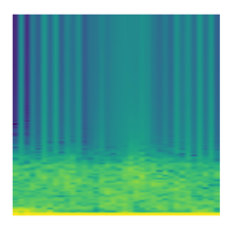

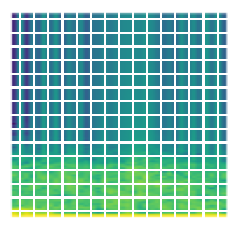

In [ ]:
plt.figure(figsize=(4, 4))
image = X_train[np.random.choice(range(X_train.shape[0]))]
plt.imshow(image.astype("uint8"))
plt.axis("off")

resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")

n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")


In [ ]:
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )

    def call(self, patch):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patch) + self.position_embedding(positions)
        return encoded

In [ ]:
def create_vit_classifier():
    model_list = []

    inputs = layers.Input(shape=input_shape)
    # Augment data.
    augmented = data_augmentation(inputs)
    # Create patches.
    patches = Patches(patch_size)(augmented)
    # Encode patches.
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)
    model_list.append(keras.Model(inputs=inputs, outputs=encoded_patches))

    # Create multiple layers of the Transformer block.
    for _ in range(transformer_layers):
        # Layer normalization 1.
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        # Create a multi-head attention layer.
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.5
        )(x1, x1)
        # Skip connection 1.
        x2 = layers.Add()([attention_output, encoded_patches])
        # Layer normalization 2.
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        # MLP.
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.5)
        # Skip connection 2.
        encoded_patches = layers.Add()([x3, x2])
        model_list.append(keras.Model(inputs=inputs, outputs=encoded_patches))

    # Create a [batch_size, projection_dim] tensor.
    representation = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    model_list.append(keras.Model(inputs=inputs, outputs=representation))
    representation = layers.Flatten()(representation)
    model_list.append(keras.Model(inputs=inputs, outputs=representation))
    representation = layers.Dropout(0.5)(representation)
    model_list.append(keras.Model(inputs=inputs, outputs=representation))
    # Add MLP.
    features = mlp(representation, hidden_units=mlp_head_units, dropout_rate=0.5)
    model_list.append(keras.Model(inputs=inputs, outputs=features))
    # Classify outputs.
    logits = layers.Dense(num_classes)(features)
    # Create the Keras model.
    model = keras.Model(inputs=inputs, outputs=logits)
    model_list.append(model)
    return model_list

model_list = create_vit_classifier()
model_list[-1].summary()

Model: "model_111"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 data_augmentation (Sequential)  (None, 112, 112, 3)  7          ['input_12[0][0]']               
                                                                                                  
 patches_14 (Patches)           (None, None, 147)    0           ['data_augmentation[0][0]']      
                                                                                                  
 patch_encoder_9 (PatchEncoder)  (None, 256, 64)     25856       ['patches_14[0][0]']     

In [ ]:
def run_experiment(model_list, X_train, y_train, X_val, y_val, X_test, y_test):
    optimizer = tfa.optimizers.AdamW(
        learning_rate=learning_rate, weight_decay=weight_decay
    )

    model = model_list[-1]
    layer_list = model_list[:-1]
    print(len(layer_list))

    model.compile(
        optimizer=optimizer,
        loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=[
            keras.metrics.SparseCategoricalAccuracy(name="accuracy")
        ],
    )

    for i in range(len(layer_list)):
        layer_list[i].compile(
            optimizer=optimizer,
            loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
            metrics=[
                keras.metrics.SparseCategoricalAccuracy(name="accuracy")
            ],
        )

    checkpoint_filepath = "/tmp/checkpoint"
    checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor="val_accuracy",
        save_best_only=True,
        save_weights_only=True,
    )

    history = model.fit(
        x=X_train,
        y=y_train,
        batch_size=batch_size,
        epochs=num_epochs,
        validation_data=(X_val, y_val),
        callbacks=[checkpoint_callback],
    )

    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['accuracy', 'val_accuracy']].plot()
    plt.show()

    model.load_weights(checkpoint_filepath)

    pred_list = []
    for i in range(len(layer_list)):
        pred_list.append(layer_list[i].predict(X_test))

    _, accuracy = model.evaluate(X_test, y_test)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")

    tsne = TSNE(n_components=2)
    for i, p in enumerate(pred_list):
        print(p.shape)
        if len(p.shape)==4:
            z = tsne.fit_transform(p.reshape(p.shape[0], p.shape[1]*p.shape[2]*p.shape[3]))
        elif len(p.shape)==3:
            z = tsne.fit_transform(p.reshape(p.shape[0], p.shape[1]*p.shape[2]))
        else:
            z = tsne.fit_transform(p.reshape(p.shape[0], p.shape[1]))
        df = pd.DataFrame()
        df["y"] = y_test
        df["comp-1"] = z[:,0]
        df["comp-2"] = z[:,1]

        sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 2),
                data=df).set(title="Sz data T-SNE projection")
        plt.show()

    return accuracy

15
Epoch 1/50
561/561 [==============================] - 59s 83ms/step - loss: 1.0868 - accuracy: 0.5175 - val_loss: 0.6899 - val_accuracy: 0.5374
Epoch 2/50
561/561 [==============================] - 43s 76ms/step - loss: 0.6918 - accuracy: 0.5358 - val_loss: 0.6904 - val_accuracy: 0.5374
Epoch 3/50
561/561 [==============================] - 43s 77ms/step - loss: 0.6918 - accuracy: 0.5356 - val_loss: 0.6903 - val_accuracy: 0.5374
Epoch 4/50
561/561 [==============================] - 44s 78ms/step - loss: 0.6920 - accuracy: 0.5344 - val_loss: 0.6903 - val_accuracy: 0.5374
Epoch 5/50
561/561 [==============================] - 44s 78ms/step - loss: 0.6917 - accuracy: 0.5349 - val_loss: 0.6907 - val_accuracy: 0.5374
Epoch 6/50
561/561 [==============================] - 44s 78ms/step - loss: 0.6920 - accuracy: 0.5366 - val_loss: 0.6904 - val_accuracy: 0.5374
Epoch 7/50
561/561 [==============================] - 43s 77ms/step - loss: 0.7023 - accuracy: 0.5320 - val_loss: 0.6905 - val_accura

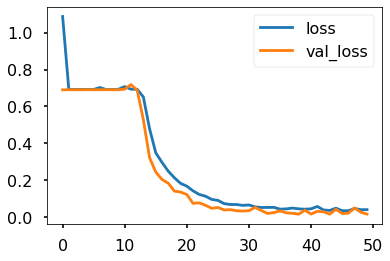

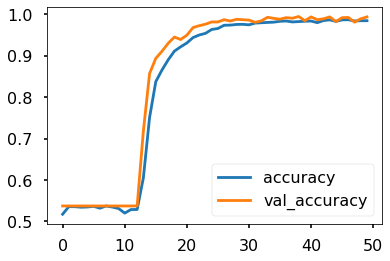

70/70 [==============================] - 2s 27ms/step - loss: 0.0218 - accuracy: 0.9929
Test accuracy: 99.29%
(2240, 144, 64)


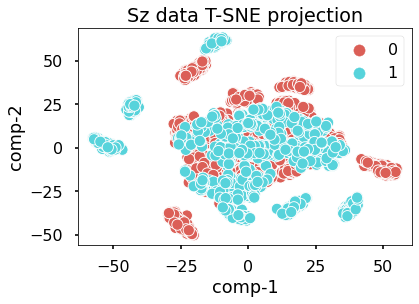

(2240, 144, 64)


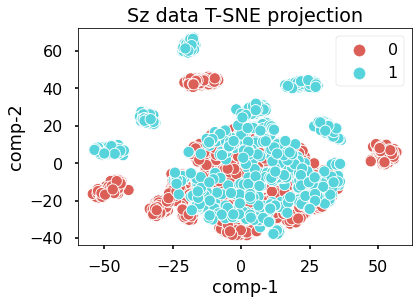

(2240, 144, 64)


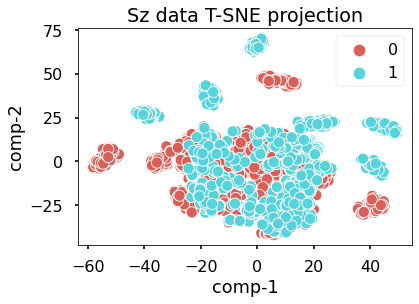

(2240, 144, 64)


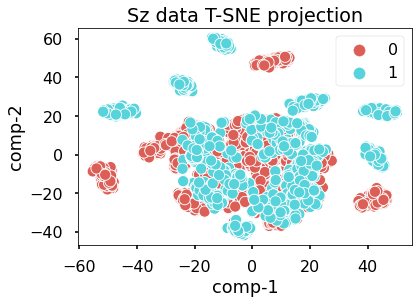

(2240, 144, 64)


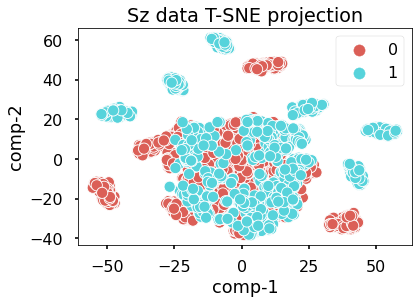

(2240, 144, 64)


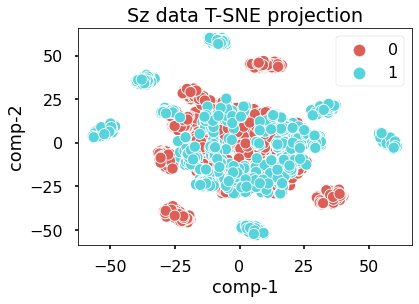

(2240, 144, 64)


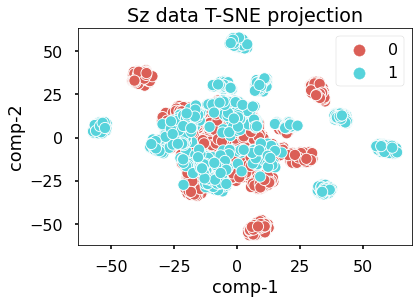

(2240, 144, 64)


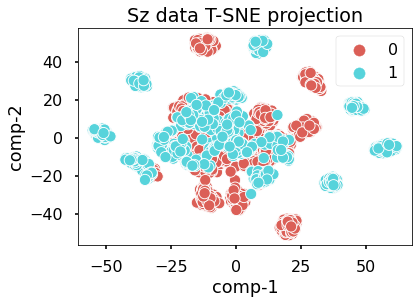

(2240, 144, 64)


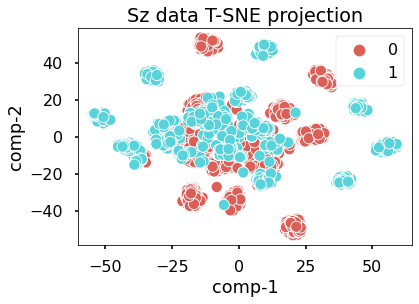

(2240, 144, 64)


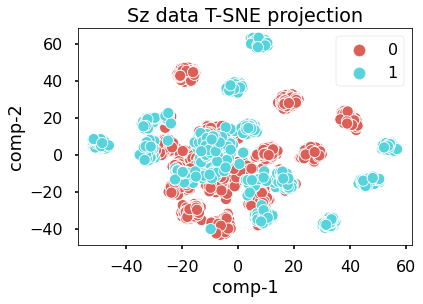

(2240, 144, 64)


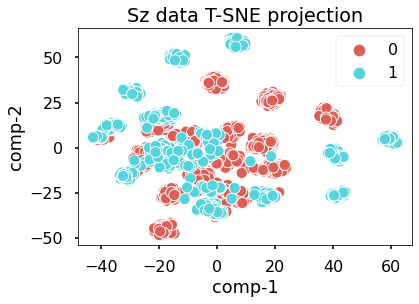

(2240, 144, 64)


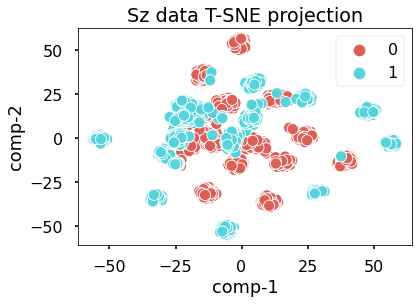

(2240, 9216)


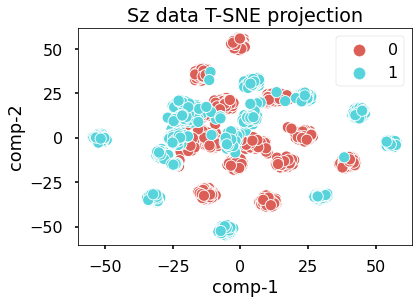

(2240, 9216)


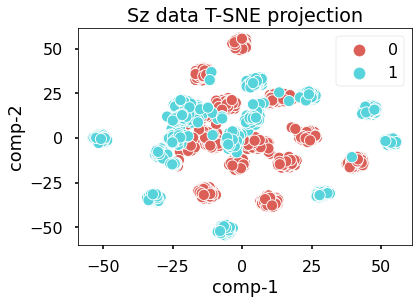

(2240, 1024)


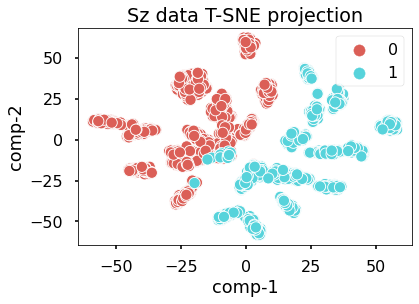

In [ ]:
vit_classifier = create_vit_classifier()
history = run_experiment(vit_classifier, X_train, y_train, X_val, y_val, X_test, y_test)

Epoch 1/50
567/567 [==============================] - 62s 83ms/step - loss: 0.9550 - accuracy: 0.5573 - val_loss: 0.5412 - val_accuracy: 0.7115
Epoch 2/50
567/567 [==============================] - 45s 79ms/step - loss: 0.4201 - accuracy: 0.7971 - val_loss: 0.2361 - val_accuracy: 0.9008
Epoch 3/50
567/567 [==============================] - 45s 79ms/step - loss: 0.2804 - accuracy: 0.8772 - val_loss: 0.1964 - val_accuracy: 0.9192
Epoch 4/50
567/567 [==============================] - 45s 80ms/step - loss: 0.2206 - accuracy: 0.9075 - val_loss: 0.1264 - val_accuracy: 0.9499
Epoch 5/50
567/567 [==============================] - 45s 79ms/step - loss: 0.1608 - accuracy: 0.9377 - val_loss: 0.0861 - val_accuracy: 0.9678
Epoch 6/50
567/567 [==============================] - 45s 79ms/step - loss: 0.1199 - accuracy: 0.9560 - val_loss: 0.0675 - val_accuracy: 0.9693
Epoch 7/50
567/567 [==============================] - 43s 77ms/step - loss: 0.0901 - accuracy: 0.9673 - val_loss: 0.0796 - val_accuracy:

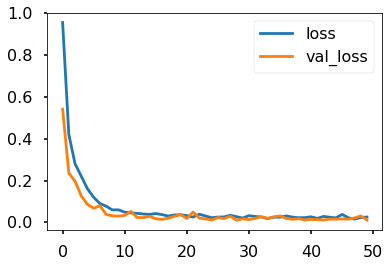

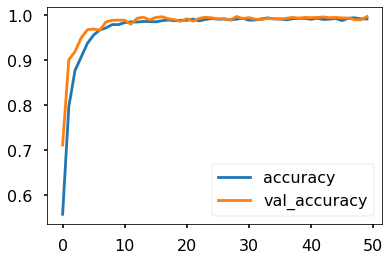

70/70 [==============================] - 2s 29ms/step - loss: 0.0144 - accuracy: 0.9973
Test accuracy: 99.73%


In [ ]:
vit_classifier = create_vit_classifier()
history = run_experiment(vit_classifier, X_train_shuffled, y_train_shuffled, X_val_shuffled, y_val_shuffled, X_test_shuffled, y_test_shuffled)

In [ ]:
vit_classifier = create_vit_classifier()
history = run_experiment(vit_classifier, X_train, y_train, X_val, y_val, X_test, y_test)

15
Epoch 1/50


In [ ]:
from sklearn.model_selection import StratifiedKFold

15
Epoch 1/50
560/560 [==============================] - 57s 78ms/step - loss: 1.1610 - accuracy: 0.5175 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 2/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6913 - accuracy: 0.5367 - val_loss: 0.6907 - val_accuracy: 0.5375
Epoch 3/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6910 - accuracy: 0.5372 - val_loss: 0.6909 - val_accuracy: 0.5375
Epoch 4/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6908 - accuracy: 0.5372 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 5/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6911 - accuracy: 0.5374 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 6/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6914 - accuracy: 0.5358 - val_loss: 0.6907 - val_accuracy: 0.5375
Epoch 7/50
560/560 [==============================] - 40s 72ms/step - loss: 0.7166 - accuracy: 0.5274 - val_loss: 0.6904 - val_accura

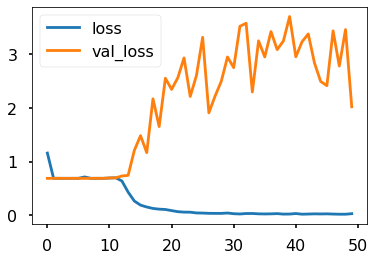

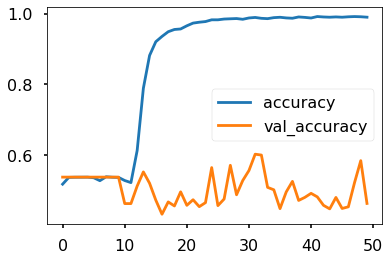

140/140 [==============================] - 3s 20ms/step - loss: 3.5197 - accuracy: 0.6025
Test accuracy: 60.25%
(4480, 144, 64)


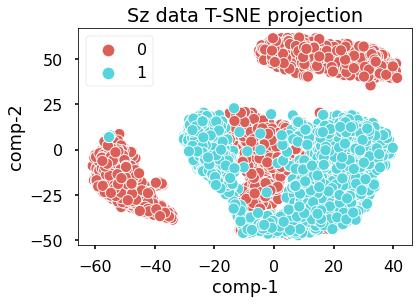

(4480, 144, 64)


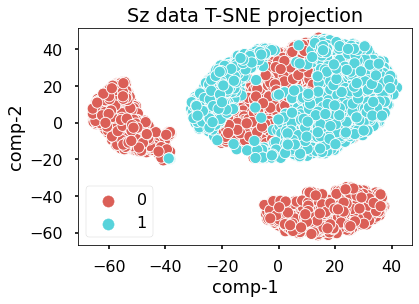

(4480, 144, 64)


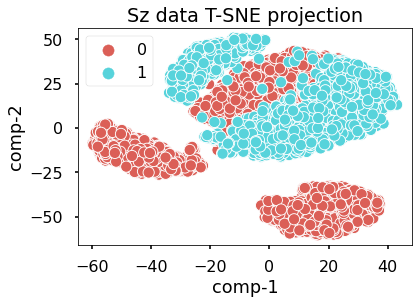

(4480, 144, 64)


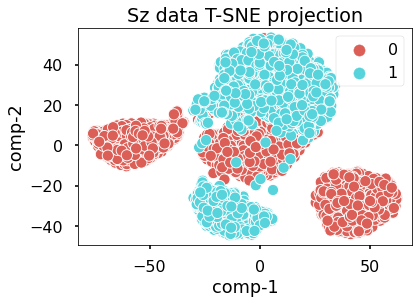

(4480, 144, 64)


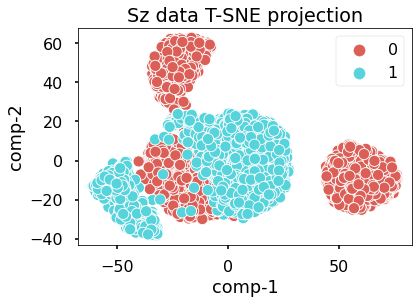

(4480, 144, 64)


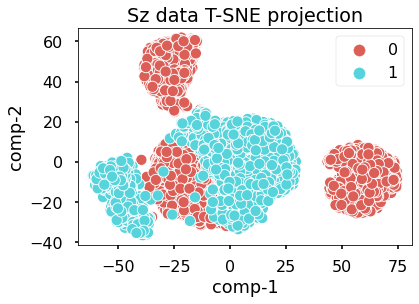

(4480, 144, 64)


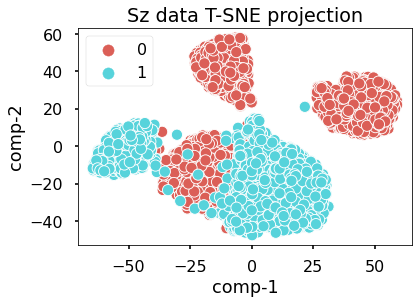

(4480, 144, 64)


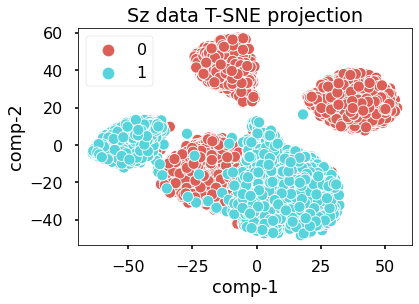

(4480, 144, 64)


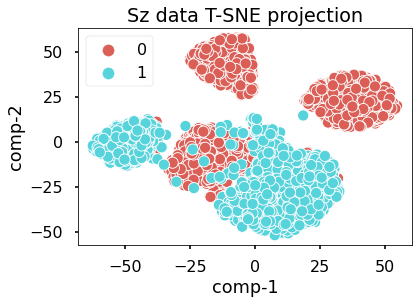

(4480, 144, 64)


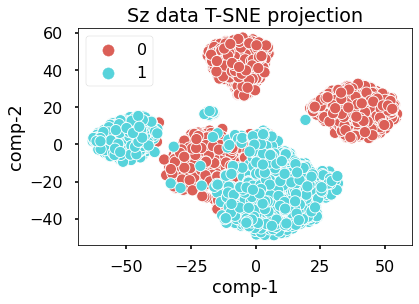

(4480, 144, 64)


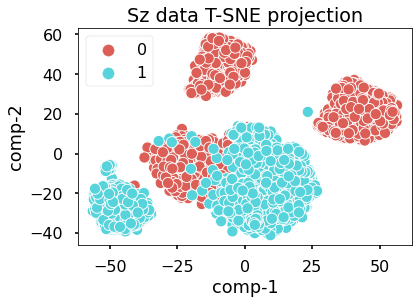

(4480, 144, 64)


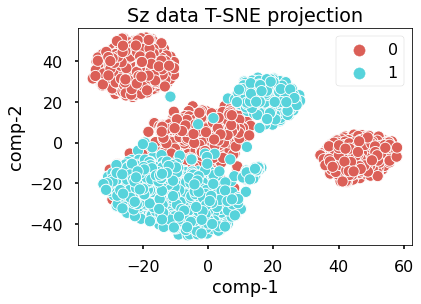

(4480, 9216)


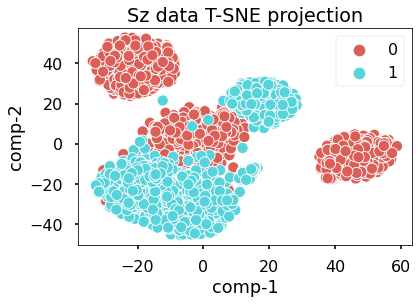

(4480, 9216)


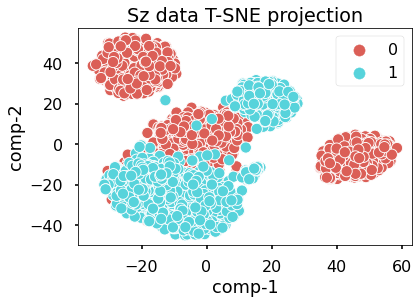

(4480, 1024)


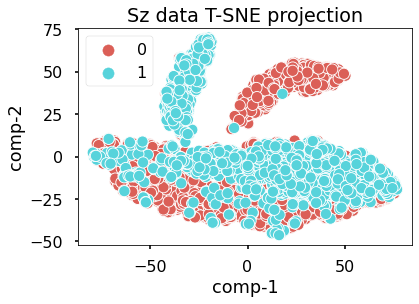

15
Epoch 1/50
560/560 [==============================] - 55s 80ms/step - loss: 1.1094 - accuracy: 0.5123 - val_loss: 0.6906 - val_accuracy: 0.5375
Epoch 2/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6920 - accuracy: 0.5340 - val_loss: 0.6905 - val_accuracy: 0.5375
Epoch 3/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6914 - accuracy: 0.5368 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 4/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6910 - accuracy: 0.5361 - val_loss: 0.6908 - val_accuracy: 0.5375
Epoch 5/50
560/560 [==============================] - 41s 72ms/step - loss: 0.6918 - accuracy: 0.5354 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 6/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6919 - accuracy: 0.5358 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 7/50
560/560 [==============================] - 41s 73ms/step - loss: 0.7062 - accuracy: 0.5315 - val_loss: 0.6903 - val_accura

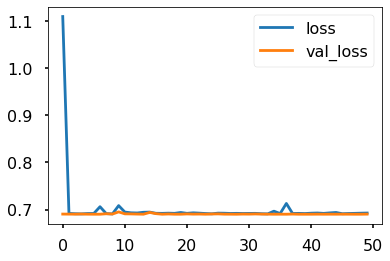

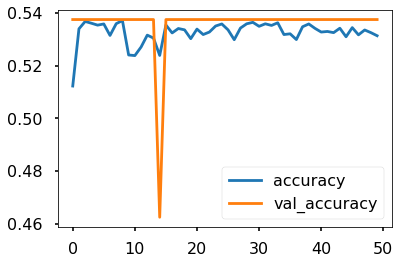

140/140 [==============================] - 3s 20ms/step - loss: 0.6906 - accuracy: 0.5375
Test accuracy: 53.75%
(4480, 144, 64)


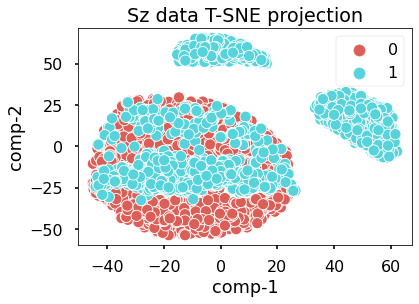

(4480, 144, 64)


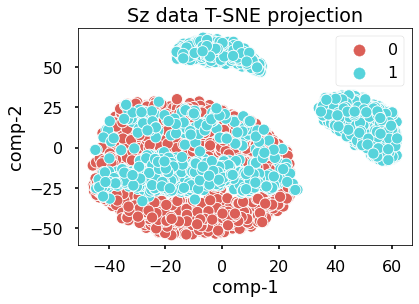

(4480, 144, 64)


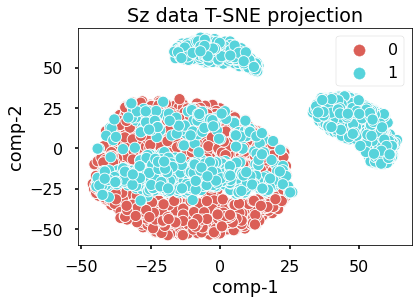

(4480, 144, 64)


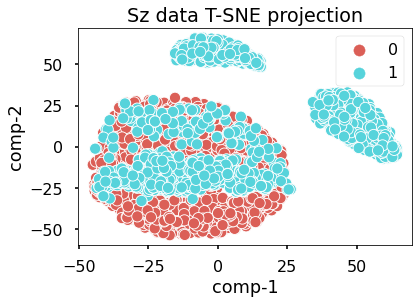

(4480, 144, 64)


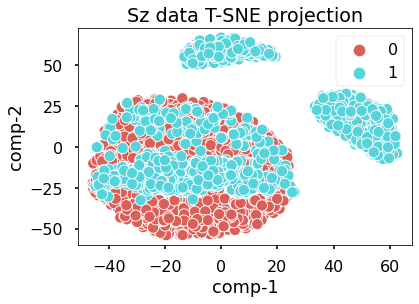

(4480, 144, 64)


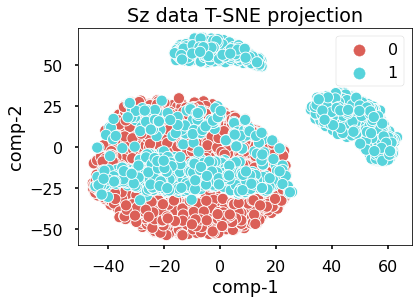

(4480, 144, 64)


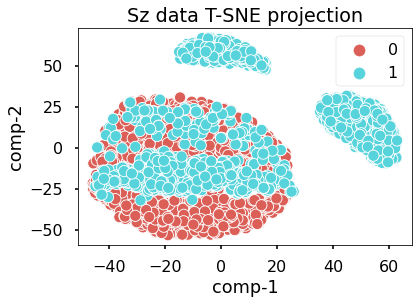

(4480, 144, 64)


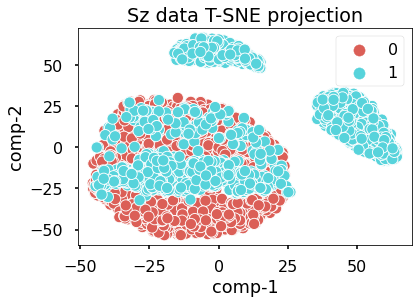

(4480, 144, 64)


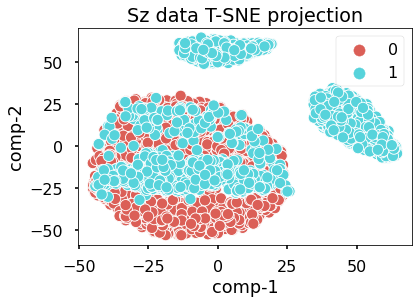

(4480, 144, 64)


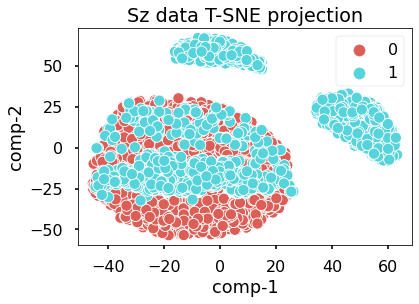

(4480, 144, 64)


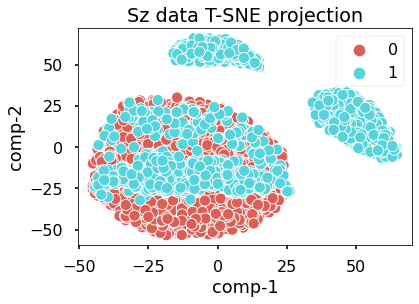

(4480, 144, 64)


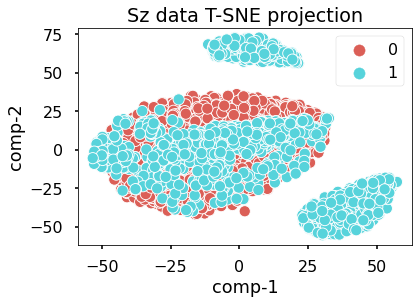

(4480, 9216)


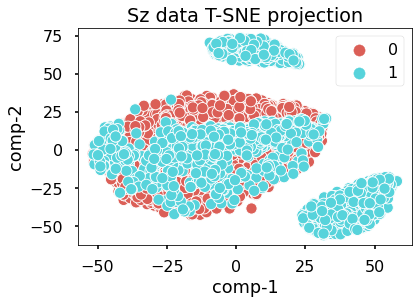

(4480, 9216)


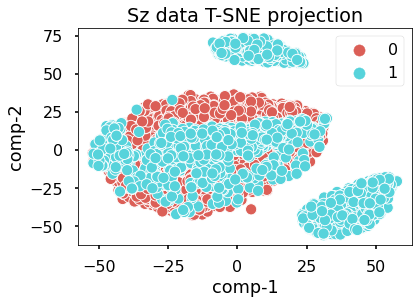

(4480, 1024)


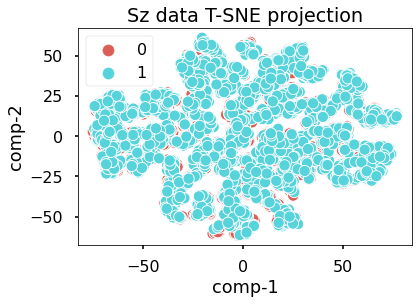

15
Epoch 1/50
560/560 [==============================] - 54s 79ms/step - loss: 1.0461 - accuracy: 0.5207 - val_loss: 0.6915 - val_accuracy: 0.5375
Epoch 2/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6913 - accuracy: 0.5364 - val_loss: 0.6918 - val_accuracy: 0.5375
Epoch 3/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6914 - accuracy: 0.5375 - val_loss: 0.6905 - val_accuracy: 0.5375
Epoch 4/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6917 - accuracy: 0.5376 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 5/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6914 - accuracy: 0.5374 - val_loss: 0.6905 - val_accuracy: 0.5375
Epoch 6/50
560/560 [==============================] - 40s 72ms/step - loss: 0.6916 - accuracy: 0.5353 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 7/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6912 - accuracy: 0.5369 - val_loss: 0.6906 - val_accura

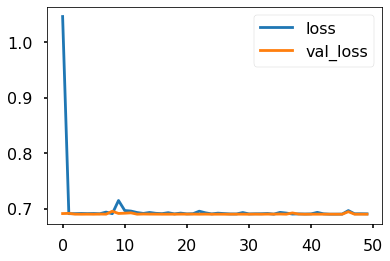

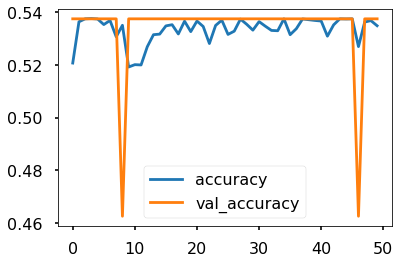

140/140 [==============================] - 3s 20ms/step - loss: 0.6915 - accuracy: 0.5375
Test accuracy: 53.75%
(4480, 144, 64)


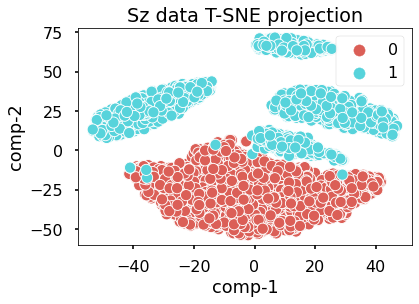

(4480, 144, 64)


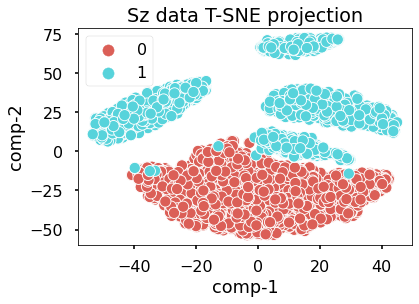

(4480, 144, 64)


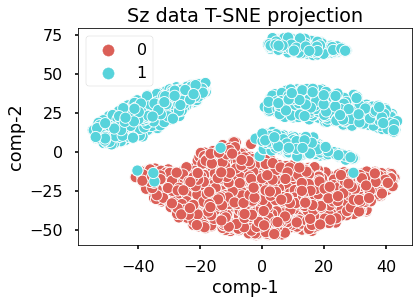

(4480, 144, 64)


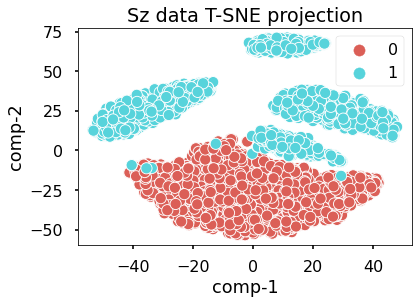

(4480, 144, 64)


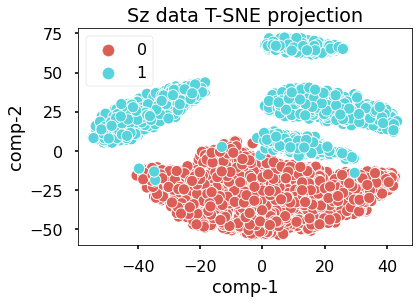

(4480, 144, 64)


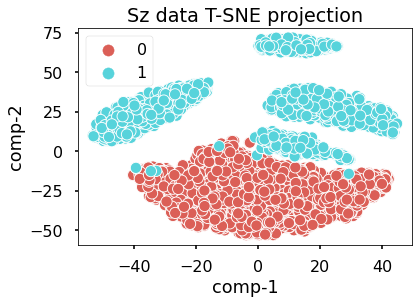

(4480, 144, 64)


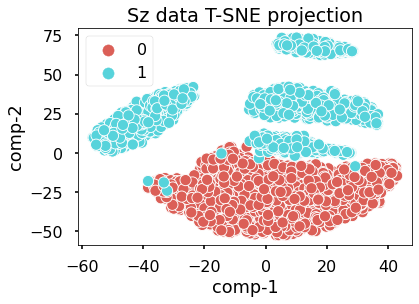

(4480, 144, 64)


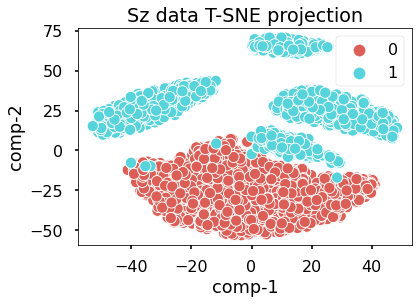

(4480, 144, 64)


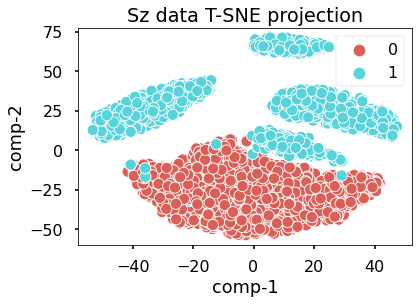

(4480, 144, 64)


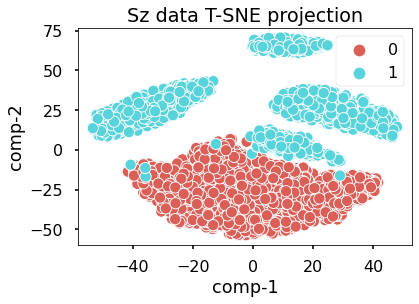

(4480, 144, 64)


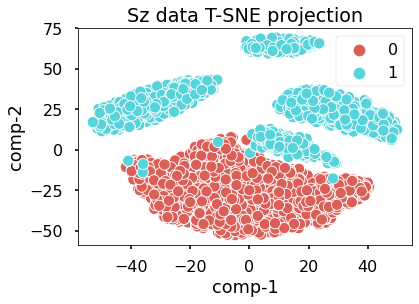

(4480, 144, 64)


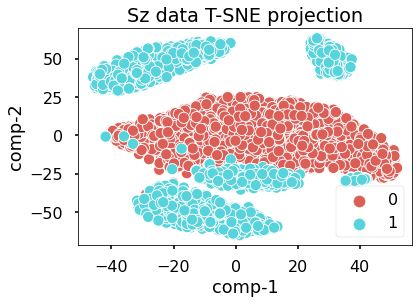

(4480, 9216)


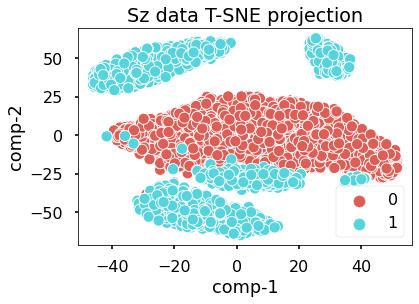

(4480, 9216)


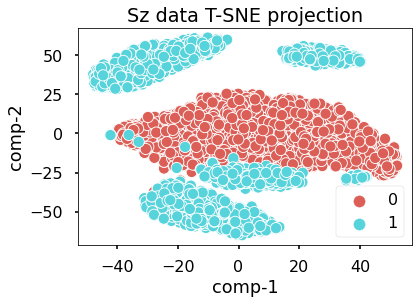

(4480, 1024)


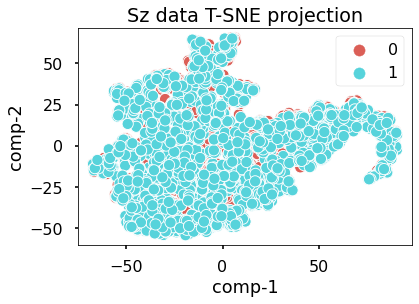

15
Epoch 1/50
560/560 [==============================] - 54s 81ms/step - loss: 1.1419 - accuracy: 0.5057 - val_loss: 0.6905 - val_accuracy: 0.5375
Epoch 2/50
560/560 [==============================] - 41s 72ms/step - loss: 0.6916 - accuracy: 0.5360 - val_loss: 0.6905 - val_accuracy: 0.5375
Epoch 3/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6911 - accuracy: 0.5370 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 4/50
560/560 [==============================] - 41s 72ms/step - loss: 0.6911 - accuracy: 0.5357 - val_loss: 0.6906 - val_accuracy: 0.5375
Epoch 5/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6911 - accuracy: 0.5373 - val_loss: 0.6919 - val_accuracy: 0.5375
Epoch 6/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6917 - accuracy: 0.5358 - val_loss: 0.6905 - val_accuracy: 0.5375
Epoch 7/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6918 - accuracy: 0.5350 - val_loss: 0.6906 - val_accura

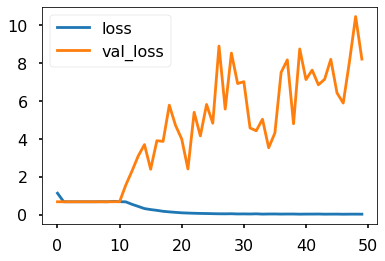

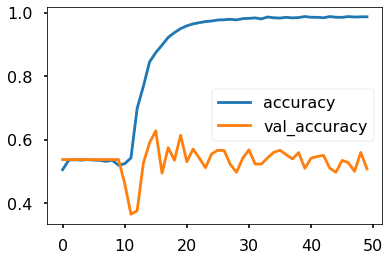

140/140 [==============================] - 3s 20ms/step - loss: 2.4033 - accuracy: 0.6281
Test accuracy: 62.81%
(4480, 144, 64)


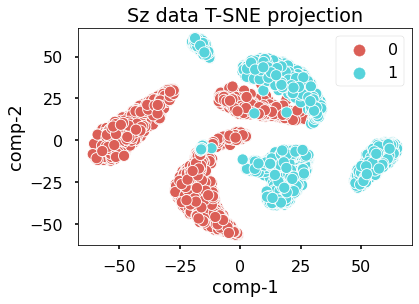

(4480, 144, 64)


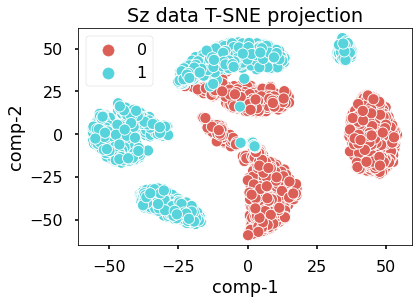

(4480, 144, 64)


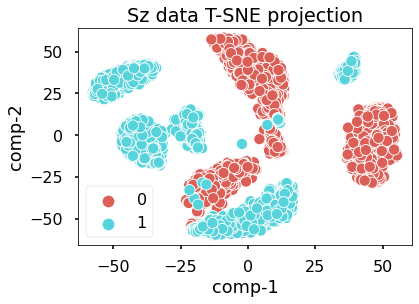

(4480, 144, 64)


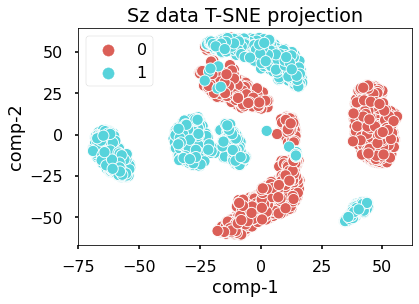

(4480, 144, 64)


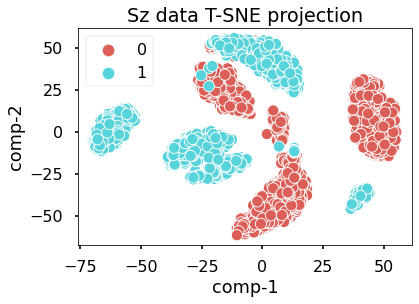

(4480, 144, 64)


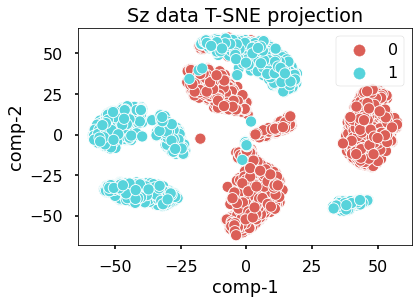

(4480, 144, 64)


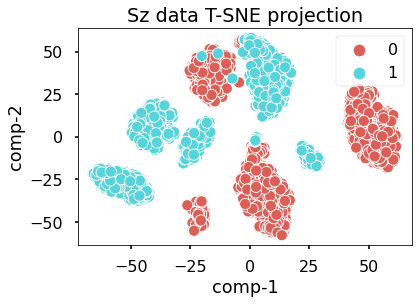

(4480, 144, 64)


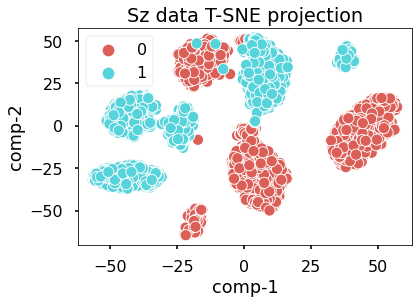

(4480, 144, 64)


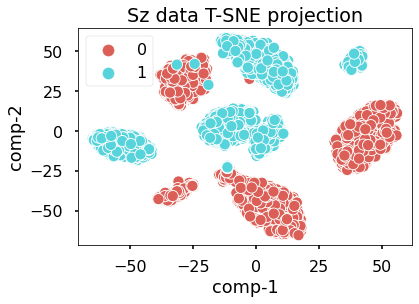

(4480, 144, 64)


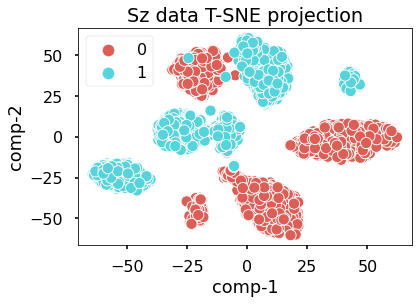

(4480, 144, 64)


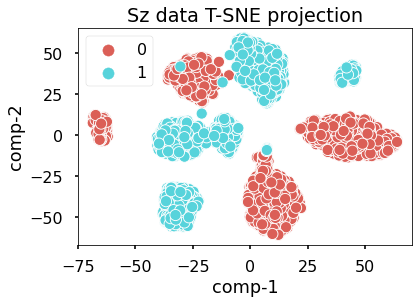

(4480, 144, 64)


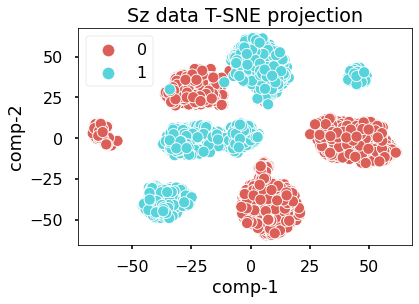

(4480, 9216)


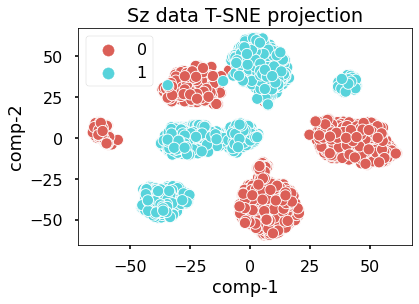

(4480, 9216)


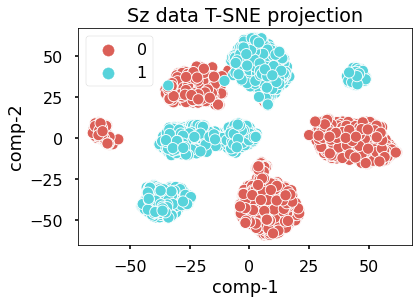

(4480, 1024)


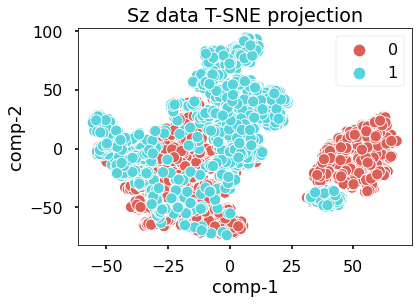

15
Epoch 1/50
560/560 [==============================] - 53s 80ms/step - loss: 1.1075 - accuracy: 0.5194 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 2/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6920 - accuracy: 0.5377 - val_loss: 0.6932 - val_accuracy: 0.4632
Epoch 3/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6919 - accuracy: 0.5369 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 4/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6913 - accuracy: 0.5365 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 5/50
560/560 [==============================] - 41s 73ms/step - loss: 0.7178 - accuracy: 0.5302 - val_loss: 0.6928 - val_accuracy: 0.5375
Epoch 6/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6915 - accuracy: 0.5354 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 7/50
560/560 [==============================] - 41s 73ms/step - loss: 0.6912 - accuracy: 0.5369 - val_loss: 0.6904 - val_accura

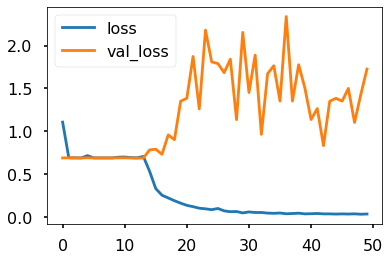

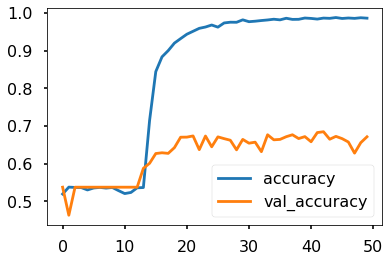

140/140 [==============================] - 3s 20ms/step - loss: 0.8339 - accuracy: 0.6846
Test accuracy: 68.46%
(4480, 144, 64)


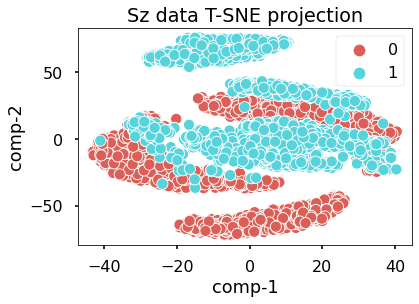

(4480, 144, 64)


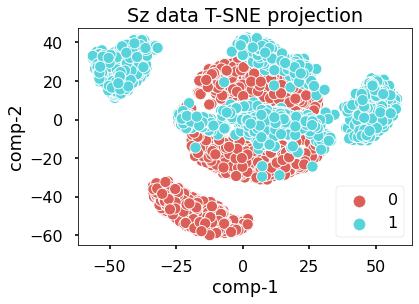

(4480, 144, 64)


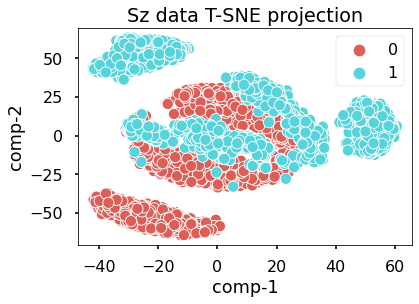

(4480, 144, 64)


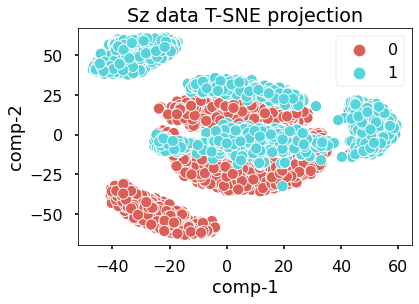

(4480, 144, 64)


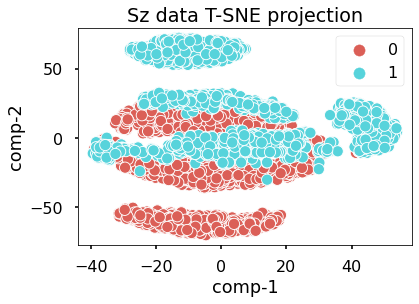

(4480, 144, 64)


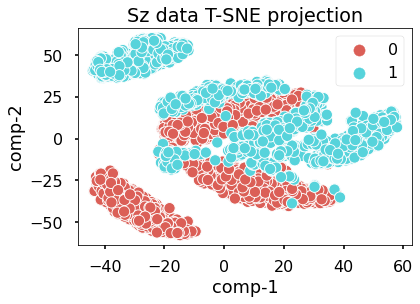

(4480, 144, 64)


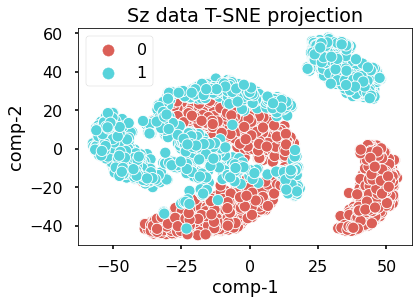

(4480, 144, 64)


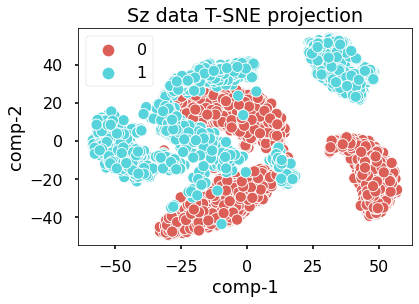

(4480, 144, 64)


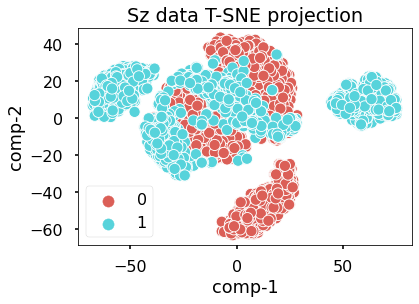

(4480, 144, 64)


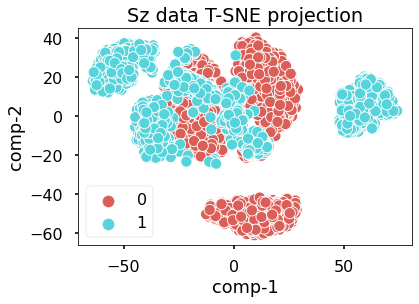

(4480, 144, 64)


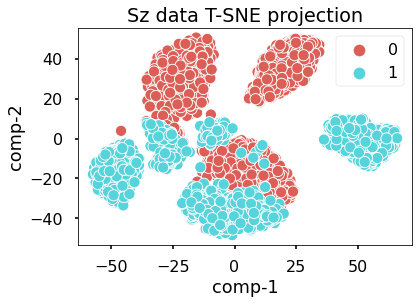

(4480, 144, 64)


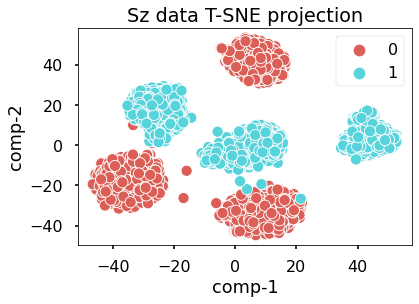

(4480, 9216)


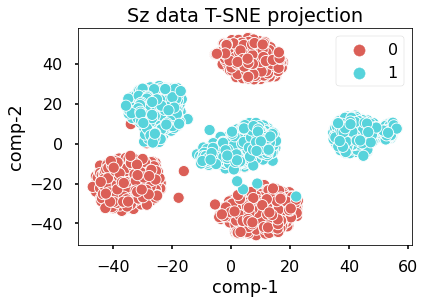

(4480, 9216)


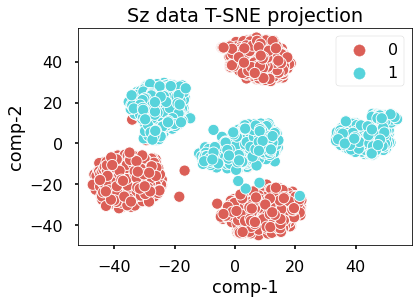

(4480, 1024)


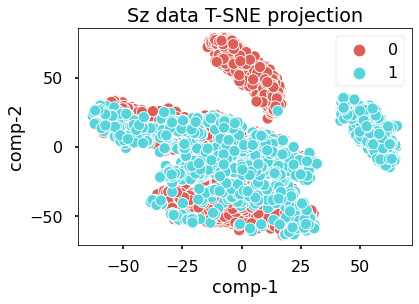

In [ ]:
accuracy=[]

Skf = StratifiedKFold(random_state=1, shuffle=True)

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    X_train, y_train = nspec_data_array[train_index], labels_array[train_index]
    X_test, y_test = nspec_data_array[test_index], labels_array[test_index]

    vit_classifier = create_vit_classifier()
    acc = run_experiment(vit_classifier, X_train, y_train, X_test, y_test, X_test, y_test)
    accuracy.append(acc)

In [ ]:
accuracy=[]

Skf = StratifiedKFold()

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    X_train, y_train = nspec_data_array[train_index], labels_array[train_index]
    X_test, y_test = nspec_data_array[test_index], labels_array[test_index]

    vit_classifier = create_vit_classifier()
    acc = run_experiment(vit_classifier, X_train, y_train, X_test, y_test, X_test, y_test)
    accuracy.append(acc)

9
Epoch 1/50
560/560 [==============================] - 44s 71ms/step - loss: 1.4255 - accuracy: 0.5204 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 2/50
560/560 [==============================] - 37s 66ms/step - loss: 0.6907 - accuracy: 0.5372 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 3/50
560/560 [==============================] - 37s 66ms/step - loss: 0.6908 - accuracy: 0.5371 - val_loss: 0.6904 - val_accuracy: 0.5375
Epoch 4/50
560/560 [==============================] - 37s 66ms/step - loss: 0.6907 - accuracy: 0.5371 - val_loss: 0.6905 - val_accuracy: 0.5375
Epoch 5/50
560/560 [==============================] - 37s 66ms/step - loss: 0.6907 - accuracy: 0.5372 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 6/50
560/560 [==============================] - 37s 67ms/step - loss: 0.6913 - accuracy: 0.5388 - val_loss: 0.6903 - val_accuracy: 0.5375
Epoch 7/50
560/560 [==============================] - 37s 67ms/step - loss: 0.6911 - accuracy: 0.5372 - val_loss: 0.6907 - val_accurac

KeyboardInterrupt: ignored

In [ ]:
print(sum(accuracy)/len(accuracy))

# Audio Spectrogram Transformer

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
from transformers import ASTFeatureExtractor

feature_extractor = ASTFeatureExtractor(sampling_rate=250, feature_size=2)

In [ ]:
inputs = feature_extractor(data_array, sampling_rate=250, padding="max_length", return_tensors="pt")
input_values = inputs.input_values
print(input_values.shape)

AssertionError: ignored